# Re-integrate with scANVI
- annoate each samples from coarse-annotated samples
- re-train with scANVI

In [1]:
import os
import pickle
import warnings
warnings.filterwarnings("ignore")

import scanpy as sc
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import mplscience

import scvi
import torch
import celltypist
import infercnvpy as cnv

np.random.seed(777)
torch.manual_seed(777)
scvi.settings.seed = 777
torch.set_float32_matmul_precision("high")

Seed set to 777


In [2]:
adata = sc.read_h5ad("../output/4_annotated.h5ad")
adata

AnnData object with n_obs × n_vars = 53408 × 29009
    obs: 'sample_id', 'sample_info', 'age', 'sex', 'barcode', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'pct_counts_mt', 'pct_counts_ribo', 'pct_counts_hb', 'scDblFinder_score', 'scDblFinder_class', 'doublet_score', 'predicted_doublet', 'cell_type', 'grade', 'GFP', 'leiden_res1', 'wb_anno', 'wb_conf_score', 'cellid_prediction', 'leiden_res2', 'new_cell_type', 'old_cell_type'
    uns: 'GFP_colors', 'cell_type_colors', 'leiden_res1', 'leiden_res2', 'log1p', 'neighbors', 'new_cell_type_colors', 'rank_genes_groups', 'umap'
    obsm: 'X_scVI', 'X_umap'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [3]:
sample_ids = adata.obs.sample_id.unique()
adatas = [adata[adata.obs.sample_id == sample_id] for sample_id in sample_ids]
sample_ids

['Mouse4', 'Mouse1', 'Mouse2', 'Mouse3', 'Control', ..., 'SRR22475911', 'SRX22734314', 'SRX22734310', 'SRX22734311', 'SRX22734312']
Length: 12
Categories (12, object): ['Control', 'Mouse1', 'Mouse2', 'Mouse3', ..., 'SRX22734310', 'SRX22734311', 'SRX22734312', 'SRX22734314']

In [4]:
wb_model = celltypist.models.Model.load(model='Mouse_Whole_Brain.pkl')

def annotate_each(adata):
    bdata = adata.copy()
    
    bdata.X = bdata.layers['counts'].copy()
    sc.pp.normalize_total(bdata)
    sc.pp.log1p(bdata)
    bdata.layers['log1p'] = bdata.X.copy()
    
    sc.pp.highly_variable_genes(bdata)
    sc.pp.scale(bdata)
    sc.pp.pca(bdata)
    sc.pp.neighbors(bdata)
    sc.tl.umap(bdata)
    sc.tl.leiden(bdata)
    
    bdata.X = bdata.layers['counts'].copy()
    sc.pp.normalize_total(bdata, target_sum=1e4)
    sc.pp.log1p(bdata)
    
    predictions = celltypist.annotate(
        bdata,
        model=wb_model,
        mode='prob match',
        p_thres=0.5
    )
    
    bdata.obs['wb_anno'] = predictions.to_adata().obs['predicted_labels']
    bdata.obs['wb_conf_score'] = predictions.to_adata().obs['conf_score']
    
    return bdata

adatas_annotated = [annotate_each(adata) for adata in adatas]

🔬 Input data has 8320 cells and 29009 genes
🔗 Matching reference genes in the model
🧬 5488 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!


🔬 Input data has 7866 cells and 29009 genes
🔗 Matching reference genes in the model
🧬 5488 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!


🔬 Input data has 4919 cells and 29009 genes
🔗 Matching reference genes in the model
🧬 5488 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!


🔬 Input data has 1527 cells and 29009 genes
🔗 Matching reference genes in the model
🧬 5488 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!


🔬 Input data has 1125 cells and 29009 genes
🔗 Matching reference genes in the model
🧬 5488 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!


🔬 Input data has 9328 cells and 29009 genes
🔗 Matching reference genes in the model
🧬 5488 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!


🔬 Input data has 9328 cells and 29009 genes
🔗 Matching reference genes in the model
🧬 5488 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!


🔬 Input data has 1397 cells and 29009 genes
🔗 Matching reference genes in the model
🧬 5488 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!


🔬 Input data has 2980 cells and 29009 genes
🔗 Matching reference genes in the model
🧬 5488 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!


🔬 Input data has 1211 cells and 29009 genes
🔗 Matching reference genes in the model
🧬 5488 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!


🔬 Input data has 3975 cells and 29009 genes
🔗 Matching reference genes in the model
🧬 5488 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!


🔬 Input data has 1432 cells and 29009 genes
🔗 Matching reference genes in the model
🧬 5488 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!


# Annotate Control samples first

### i = 5

['Mid1']
Categories (1, object): ['Mid1']


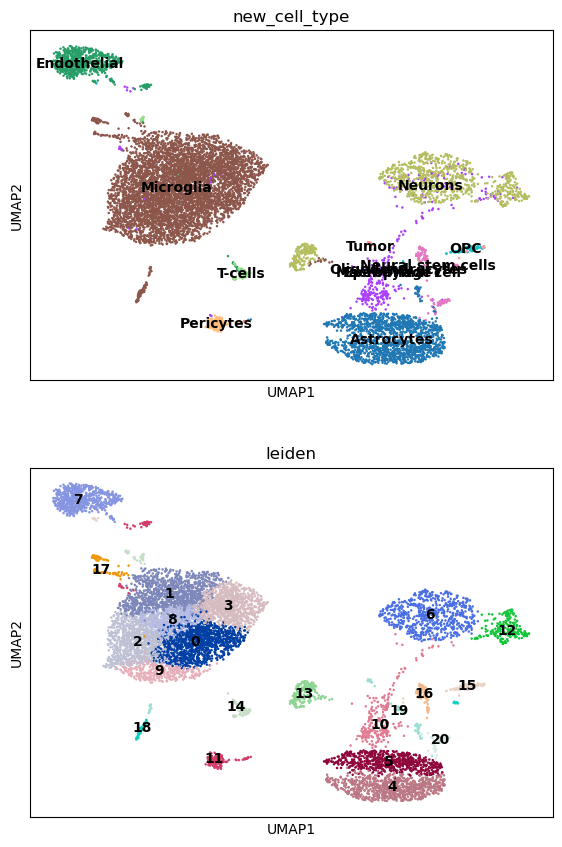

In [40]:
i = 5
print(adatas_annotated[i].obs.sample_info.unique())
sc.pl.umap(adatas_annotated[i], color = ['new_cell_type', 'leiden'], ncols = 1, legend_loc = 'on data')

In [50]:
labels = adatas_annotated[i].obs[['wb_anno', 'cellid_prediction', 'leiden', 'cell_type', 'old_cell_type']].groupby('leiden').agg(lambda x:x.mode())
scores = adatas_annotated[i].obs[['wb_conf_score', 'leiden']].groupby('leiden').agg(lambda x:x.mean())
last_check = labels.merge(right = scores, left_index=True, right_index=True)
last_check

,wb_anno,cellid_prediction,cell_type,old_cell_type,wb_conf_score
leiden,,,,,
0,334 Microglia NN,unassigned,Microglia,"[], Categories (0, object): []",0.925860
1,334 Microglia NN,unassigned,Microglia,"[], Categories (0, object): []",0.937782
2,334 Microglia NN,unassigned,Microglia,"[], Categories (0, object): []",0.972967
3,334 Microglia NN,unassigned,Microglia,"[], Categories (0, object): []",0.853728
4,319 Astro-TE NN,unassigned,Astrocytes,"[], Categories (0, object): []",0.991802
5,319 Astro-TE NN,Astrocytes,Astrocytes,"[], Categories (0, object): []",0.953157
6,037 DG Glut,unassigned,Neurons,"[], Categories (0, object): []",0.946828
7,333 Endo NN,Endothelial,Endothelial,"[], Categories (0, object): []",0.922574
8,334 Microglia NN,Microglia,Microglia,"[], Categories (0, object): []",0.969771


In [44]:
for j in range(len(adatas_annotated[i].obs.leiden.unique())):
    print(f"'{j}' : '',")

'0' : '',
'1' : '',
'2' : '',
'3' : '',
'4' : '',
'5' : '',
'6' : '',
'7' : '',
'8' : '',
'9' : '',
'10' : '',
'11' : '',
'12' : '',
'13' : '',
'14' : '',
'15' : '',
'16' : '',
'17' : '',
'18' : '',
'19' : '',
'20' : '',


... storing 'each_cell_type' as categorical


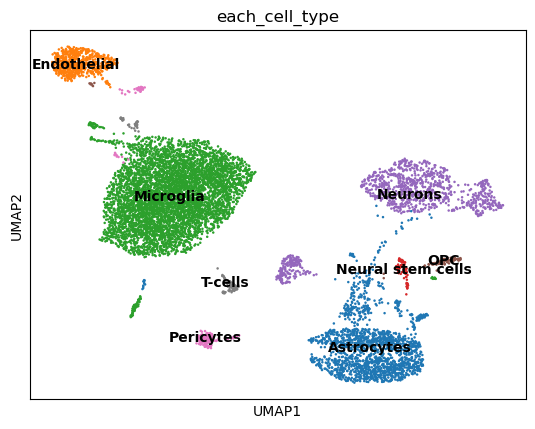

In [47]:
cell_annotation = {
    '0' : 'Microglia',
    '1' : 'Microglia',
    '2' : 'Microglia',
    '3' : 'Microglia',
    '4' : 'Astrocytes',
    '5' : 'Astrocytes',
    '6' : 'Neurons',
    '7' : 'Endothelial',
    '8' : 'Microglia',
    '9' : 'Microglia',
    '10' : 'Astrocytes',
    '11' : 'Pericytes',
    '12' : 'Neurons',
    '13' : 'Neurons',
    '14' : 'T-cells',
    '15' : 'OPC',
    '16' : 'Neural stem cells',
    '17' : 'Microglia',
    '18' : 'Microglia',
    '19' : 'Astrocytes',
    '20' : 'Astrocytes',
}
adatas_annotated[i].obs['each_cell_type'] = adatas_annotated[i].obs.leiden.astype(str).map(cell_annotation)

sc.pl.umap(adatas_annotated[i], color = ['each_cell_type'], ncols = 1, legend_loc = 'on data')

### i = 6

['Mid2']
Categories (1, object): ['Mid2']


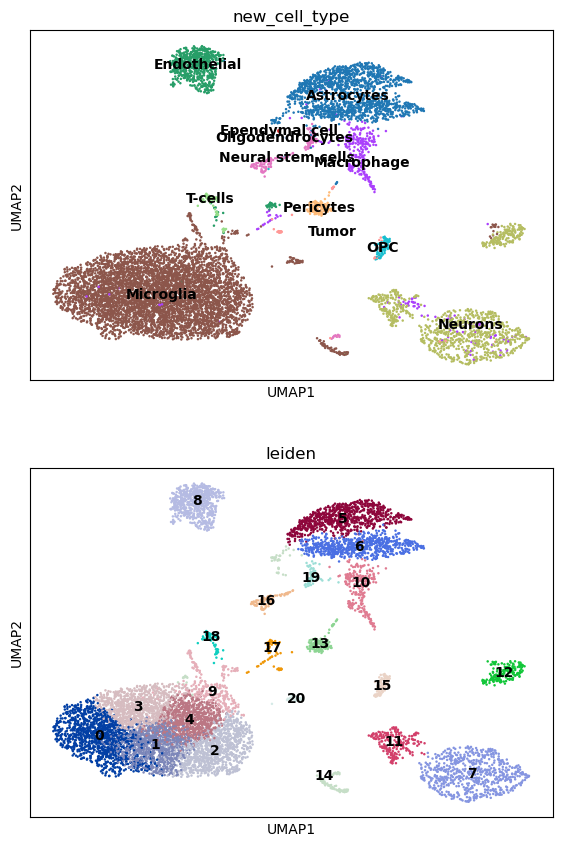

In [51]:
i = 6
print(adatas_annotated[i].obs.sample_info.unique())
sc.pl.umap(adatas_annotated[i], color = ['new_cell_type', 'leiden'], ncols = 1, legend_loc = 'on data')

In [52]:
labels = adatas_annotated[i].obs[['wb_anno', 'cellid_prediction', 'leiden', 'cell_type', 'old_cell_type']].groupby('leiden').agg(lambda x:x.mode())
scores = adatas_annotated[i].obs[['wb_conf_score', 'leiden']].groupby('leiden').agg(lambda x:x.mean())
last_check = labels.merge(right = scores, left_index=True, right_index=True)
last_check

,wb_anno,cellid_prediction,cell_type,old_cell_type,wb_conf_score
leiden,,,,,
0,334 Microglia NN,unassigned,Microglia,"[], Categories (0, object): []",0.933910
1,334 Microglia NN,unassigned,Microglia,"[], Categories (0, object): []",0.948713
2,334 Microglia NN,unassigned,Microglia,"[], Categories (0, object): []",0.870354
3,334 Microglia NN,unassigned,Microglia,"[], Categories (0, object): []",0.973907
4,334 Microglia NN,unassigned,Microglia,"[], Categories (0, object): []",0.947676
5,319 Astro-TE NN,unassigned,Astrocytes,"[], Categories (0, object): []",0.993557
6,319 Astro-TE NN,Astrocytes,Astrocytes,"[], Categories (0, object): []",0.946585
7,037 DG Glut,unassigned,Neurons,"[], Categories (0, object): []",0.944810
8,333 Endo NN,Endothelial,Endothelial,"[], Categories (0, object): []",0.923119


In [53]:
for j in range(len(adatas_annotated[i].obs.leiden.unique())):
    print(f"'{j}' : '',")

'0' : '',
'1' : '',
'2' : '',
'3' : '',
'4' : '',
'5' : '',
'6' : '',
'7' : '',
'8' : '',
'9' : '',
'10' : '',
'11' : '',
'12' : '',
'13' : '',
'14' : '',
'15' : '',
'16' : '',
'17' : '',
'18' : '',
'19' : '',
'20' : '',


... storing 'each_cell_type' as categorical


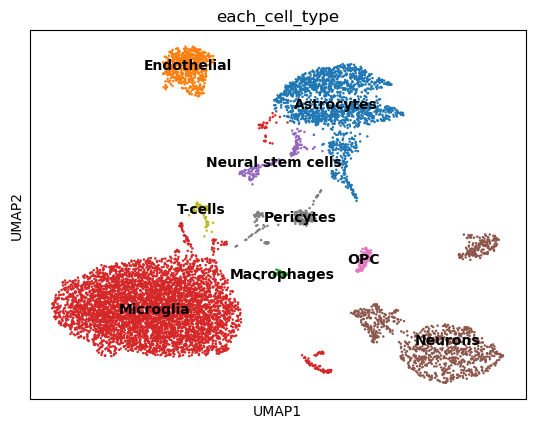

In [54]:
cell_annotation = {
    '0' : 'Microglia',
    '1' : 'Microglia',
    '2' : 'Microglia',
    '3' : 'Microglia',
    '4' : 'Microglia',
    '5' : 'Astrocytes',
    '6' : 'Astrocytes',
    '7' : 'Neurons',
    '8' : 'Endothelial',
    '9' : 'Microglia',
    '10' : 'Astrocytes', #
    '11' : 'Neurons',
    '12' : 'Neurons',
    '13' : 'Pericytes',
    '14' : 'Microglia',
    '15' : 'OPC',
    '10' : 'Astrocytes', #
    '16' : 'Neural stem cells',
    '17' : 'Pericytes',
    '18' : 'T-cells',
    '19' : 'Neural stem cells',
    '20' : 'Macrophages',
}
adatas_annotated[i].obs['each_cell_type'] = adatas_annotated[i].obs.leiden.astype(str).map(cell_annotation)

sc.pl.umap(adatas_annotated[i], color = ['each_cell_type'], ncols = 1, legend_loc = 'on data')

### i = 7

['SNU11']
Categories (1, object): ['SNU11']


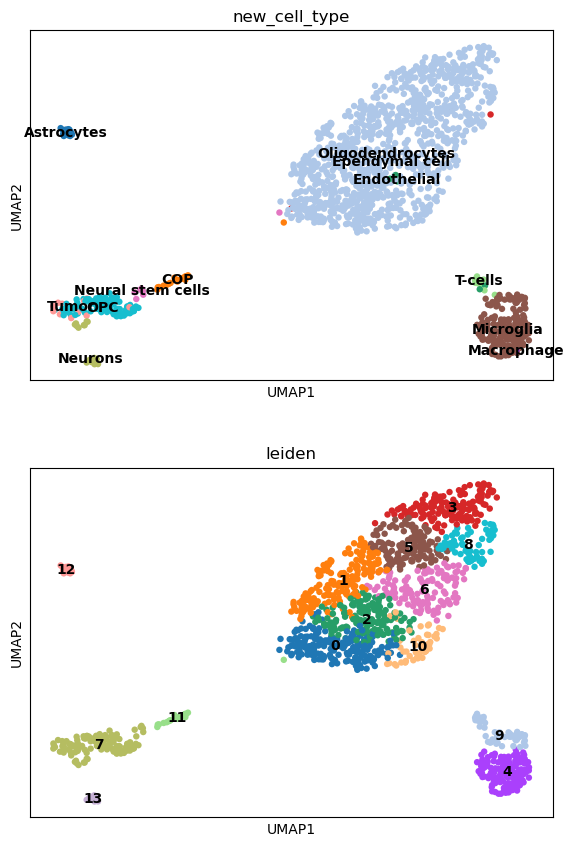

In [55]:
i = 7
print(adatas_annotated[i].obs.sample_info.unique())
sc.pl.umap(adatas_annotated[i], color = ['new_cell_type', 'leiden'], ncols = 1, legend_loc = 'on data')

In [56]:
labels = adatas_annotated[i].obs[['wb_anno', 'cellid_prediction', 'leiden', 'cell_type', 'old_cell_type']].groupby('leiden').agg(lambda x:x.mode())
scores = adatas_annotated[i].obs[['wb_conf_score', 'leiden']].groupby('leiden').agg(lambda x:x.mean())
last_check = labels.merge(right = scores, left_index=True, right_index=True)
last_check

,wb_anno,cellid_prediction,cell_type,old_cell_type,wb_conf_score
leiden,,,,,
0,327 Oligo NN,unassigned,Oligodendrocytes,"[], Categories (0, object): []",0.999983
1,327 Oligo NN,Oligodendrocytes,Oligodendrocytes,"[], Categories (0, object): []",1.000000
2,327 Oligo NN,Oligodendrocytes,Oligodendrocytes,"[], Categories (0, object): []",1.000000
3,327 Oligo NN,Oligodendrocytes,Oligodendrocytes,"[], Categories (0, object): []",1.000000
4,334 Microglia NN,unassigned,Microglia,"[], Categories (0, object): []",0.999771
5,327 Oligo NN,Oligodendrocytes,Oligodendrocytes,"[], Categories (0, object): []",1.000000
6,327 Oligo NN,Oligodendrocytes,Oligodendrocytes,"[], Categories (0, object): []",1.000000
7,326 OPC NN,unassigned,OPC,"[], Categories (0, object): []",0.991849
8,327 Oligo NN,Oligodendrocytes,Oligodendrocytes,"[], Categories (0, object): []",0.989661


In [57]:
for j in range(len(adatas_annotated[i].obs.leiden.unique())):
    print(f"'{j}' : '',")

'0' : '',
'1' : '',
'2' : '',
'3' : '',
'4' : '',
'5' : '',
'6' : '',
'7' : '',
'8' : '',
'9' : '',
'10' : '',
'11' : '',
'12' : '',
'13' : '',


... storing 'each_cell_type' as categorical


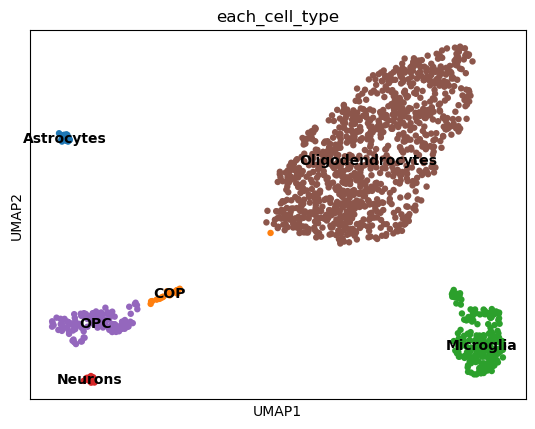

In [58]:
cell_annotation = {
    '0' : 'Oligodendrocytes',
    '1' : 'Oligodendrocytes',
    '2' : 'Oligodendrocytes',
    '3' : 'Oligodendrocytes',
    '4' : 'Microglia',
    '5' : 'Oligodendrocytes',
    '6' : 'Oligodendrocytes',
    '7' : 'OPC',
    '8' : 'Oligodendrocytes',
    '9' : 'Microglia',
    '10' : 'Oligodendrocytes',
    '11' : 'COP',
    '12' : 'Astrocytes',
    '13' : 'Neurons',
}
adatas_annotated[i].obs['each_cell_type'] = adatas_annotated[i].obs.leiden.astype(str).map(cell_annotation)

sc.pl.umap(adatas_annotated[i], color = ['each_cell_type'], ncols = 1, legend_loc = 'on data')

### i = 8

['S1']
Categories (1, object): ['S1']


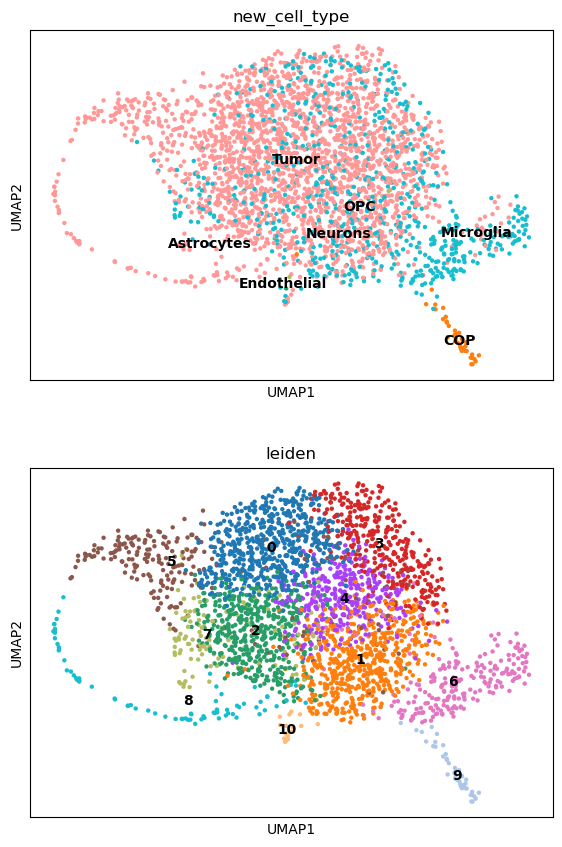

In [59]:
i = 8
print(adatas_annotated[i].obs.sample_info.unique())
sc.pl.umap(adatas_annotated[i], color = ['new_cell_type', 'leiden'], ncols = 1, legend_loc = 'on data')

In [60]:
labels = adatas_annotated[i].obs[['wb_anno', 'cellid_prediction', 'leiden', 'cell_type', 'old_cell_type']].groupby('leiden').agg(lambda x:x.mode())
scores = adatas_annotated[i].obs[['wb_conf_score', 'leiden']].groupby('leiden').agg(lambda x:x.mean())
last_check = labels.merge(right = scores, left_index=True, right_index=True)
last_check

,wb_anno,cellid_prediction,cell_type,old_cell_type,wb_conf_score
leiden,,,,,
0,326 OPC NN,unassigned,Tumor,"[], Categories (0, object): []",0.994234
1,326 OPC NN,unassigned,Tumor,"[], Categories (0, object): []",0.990170
2,326 OPC NN,unassigned,Tumor,"[], Categories (0, object): []",0.989227
3,326 OPC NN,unassigned,Tumor,"[], Categories (0, object): []",0.986947
4,326 OPC NN,unassigned,Tumor,"[], Categories (0, object): []",0.995329
5,326 OPC NN,unassigned,Tumor,"[], Categories (0, object): []",0.990170
6,326 OPC NN,unassigned,OPC,"[], Categories (0, object): []",0.979175
7,326 OPC NN,unassigned,Tumor,"[], Categories (0, object): []",0.990623
8,326 OPC NN,unassigned,Tumor,"[], Categories (0, object): []",0.986917


In [61]:
for j in range(len(adatas_annotated[i].obs.leiden.unique())):
    print(f"'{j}' : '',")

'0' : '',
'1' : '',
'2' : '',
'3' : '',
'4' : '',
'5' : '',
'6' : '',
'7' : '',
'8' : '',
'9' : '',
'10' : '',


... storing 'each_cell_type' as categorical


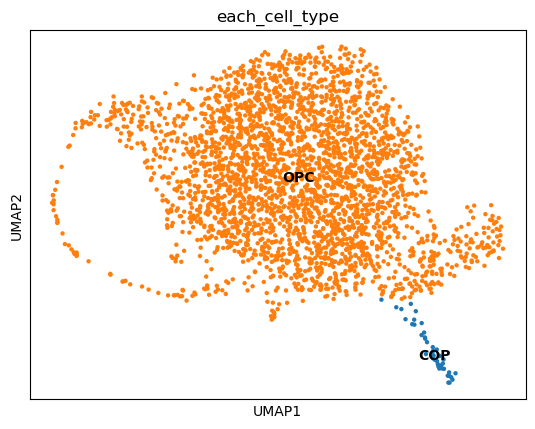

... storing 'each_cell_type' as categorical


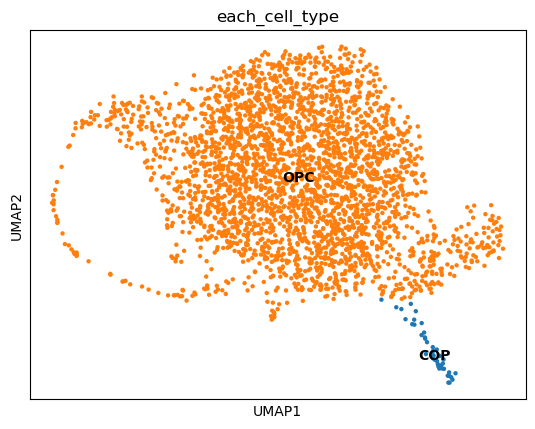

In [ ]:
cell_annotation = {
    '0' : 'OPC',
    '1' : 'OPC',
    '2' : 'OPC',
    '3' : 'OPC',
    '4' : 'OPC',
    '5' : 'OPC',
    '6' : 'OPC',
    '7' : 'OPC',
    '8' : 'OPC',
    '9' : 'COP',
    '10' : 'OPC',
}
adatas_annotated[i].obs['each_cell_type'] = adatas_annotated[i].obs.leiden.astype(str).map(cell_annotation)

sc.pl.umap(adatas_annotated[i], color = ['each_cell_type'], ncols = 1, legend_loc = 'on data')

### i = 9

['S2']
Categories (1, object): ['S2']


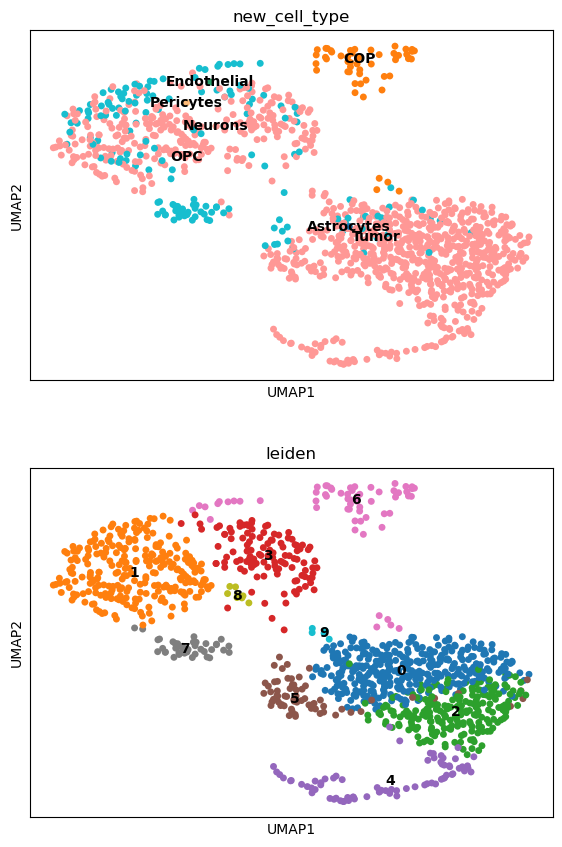

In [64]:
i = 9
print(adatas_annotated[i].obs.sample_info.unique())
sc.pl.umap(adatas_annotated[i], color = ['new_cell_type', 'leiden'], ncols = 1, legend_loc = 'on data')

In [65]:
labels = adatas_annotated[i].obs[['wb_anno', 'cellid_prediction', 'leiden', 'cell_type', 'old_cell_type']].groupby('leiden').agg(lambda x:x.mode())
scores = adatas_annotated[i].obs[['wb_conf_score', 'leiden']].groupby('leiden').agg(lambda x:x.mean())
last_check = labels.merge(right = scores, left_index=True, right_index=True)
last_check

,wb_anno,cellid_prediction,cell_type,old_cell_type,wb_conf_score
leiden,,,,,
0,326 OPC NN,unassigned,Tumor,"[], Categories (0, object): []",0.954895
1,326 OPC NN,unassigned,Tumor,"[], Categories (0, object): []",0.994775
2,326 OPC NN,unassigned,Tumor,"[], Categories (0, object): []",0.944764
3,326 OPC NN,unassigned,Tumor,"[], Categories (0, object): []",0.998915
4,326 OPC NN,Cycling,Tumor,"[], Categories (0, object): []",0.939410
5,326 OPC NN,unassigned,Tumor,"[], Categories (0, object): []",0.967707
6,327 Oligo NN,unassigned,COP,"[], Categories (0, object): []",0.993965
7,326 OPC NN,unassigned,OPC,"[], Categories (0, object): []",0.977175
8,326 OPC NN,Cycling,Tumor,"[], Categories (0, object): []",0.998209


In [66]:
for j in range(len(adatas_annotated[i].obs.leiden.unique())):
    print(f"'{j}' : '',")

'0' : '',
'1' : '',
'2' : '',
'3' : '',
'4' : '',
'5' : '',
'6' : '',
'7' : '',
'8' : '',
'9' : '',


... storing 'each_cell_type' as categorical


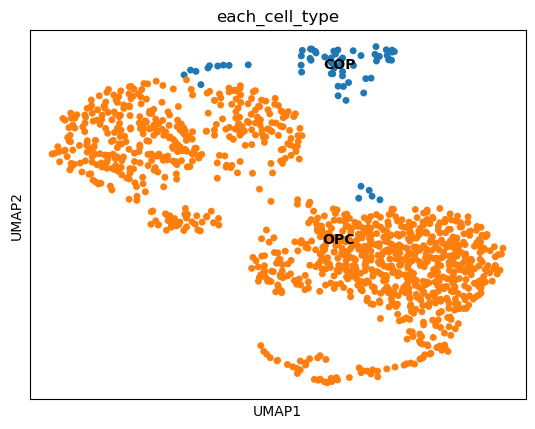

... storing 'each_cell_type' as categorical


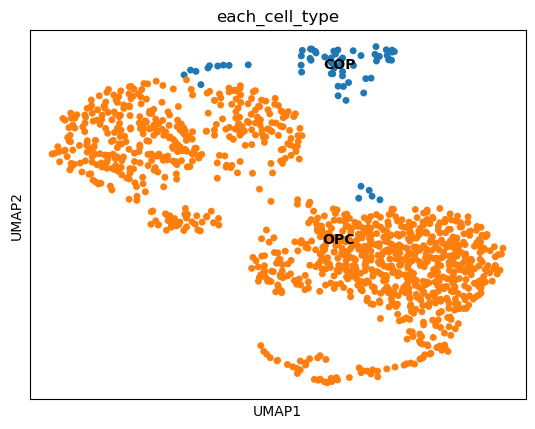

In [ ]:
cell_annotation = {
    '0' : 'OPC',
    '1' : 'OPC',
    '2' : 'OPC',
    '3' : 'OPC',
    '4' : 'OPC',
    '5' : 'OPC',
    '6' : 'COP',
    '7' : 'OPC',
    '8' : 'OPC',
    '9' : 'OPC',
}
adatas_annotated[i].obs['each_cell_type'] = adatas_annotated[i].obs.leiden.astype(str).map(cell_annotation)

sc.pl.umap(adatas_annotated[i], color = ['each_cell_type'], ncols = 1, legend_loc = 'on data')

### i = 10

['S3']
Categories (1, object): ['S3']


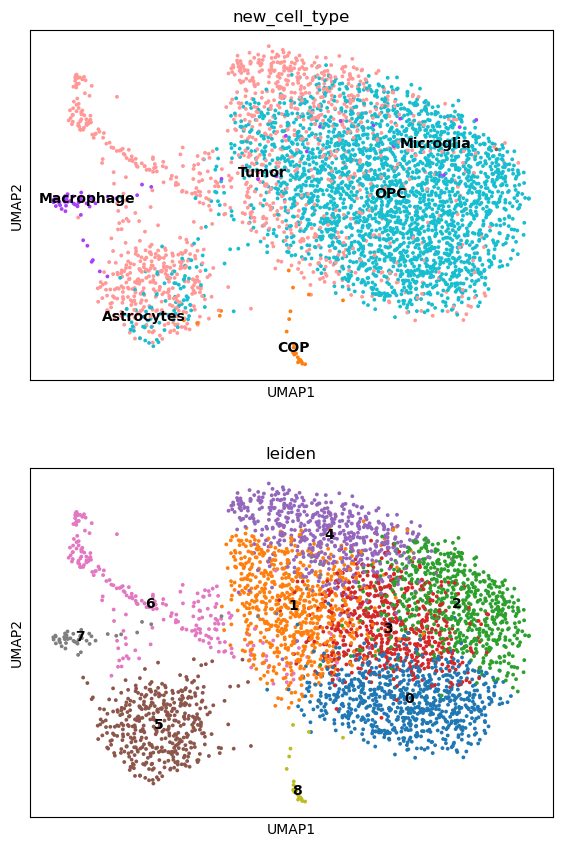

In [68]:
i = 10
print(adatas_annotated[i].obs.sample_info.unique())
sc.pl.umap(adatas_annotated[i], color = ['new_cell_type', 'leiden'], ncols = 1, legend_loc = 'on data')

In [69]:
labels = adatas_annotated[i].obs[['wb_anno', 'cellid_prediction', 'leiden', 'cell_type', 'old_cell_type']].groupby('leiden').agg(lambda x:x.mode())
scores = adatas_annotated[i].obs[['wb_conf_score', 'leiden']].groupby('leiden').agg(lambda x:x.mean())
last_check = labels.merge(right = scores, left_index=True, right_index=True)
last_check

,wb_anno,cellid_prediction,cell_type,old_cell_type,wb_conf_score
leiden,,,,,
0,326 OPC NN,unassigned,OPC,"[], Categories (0, object): []",0.935887
1,326 OPC NN,unassigned,OPC,"[], Categories (0, object): []",0.938699
2,326 OPC NN,unassigned,OPC,"[], Categories (0, object): []",0.857866
3,326 OPC NN,unassigned,OPC,"[], Categories (0, object): []",0.949625
4,326 OPC NN,unassigned,Tumor,"[], Categories (0, object): []",0.791092
5,326 OPC NN,unassigned,Tumor,"[], Categories (0, object): []",0.944370
6,326 OPC NN,unassigned,Tumor,"[], Categories (0, object): []",0.887477
7,Unassigned,unassigned,Macrophage,"[], Categories (0, object): []",0.447991
8,327 Oligo NN,unassigned,COP,"[], Categories (0, object): []",0.985484


In [70]:
for j in range(len(adatas_annotated[i].obs.leiden.unique())):
    print(f"'{j}' : '',")

'0' : '',
'1' : '',
'2' : '',
'3' : '',
'4' : '',
'5' : '',
'6' : '',
'7' : '',
'8' : '',


... storing 'each_cell_type' as categorical


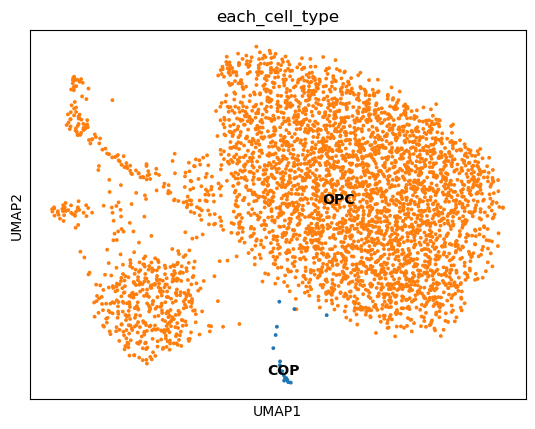

... storing 'each_cell_type' as categorical


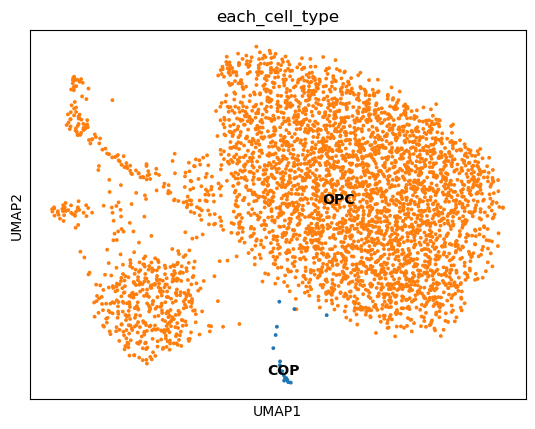

In [ ]:
cell_annotation = {
    '0' : 'OPC',
    '1' : 'OPC',
    '2' : 'OPC',
    '3' : 'OPC',
    '4' : 'OPC',
    '5' : 'OPC',
    '6' : 'OPC',
    '7' : 'OPC',
    '8' : 'COP',
}
adatas_annotated[i].obs['each_cell_type'] = adatas_annotated[i].obs.leiden.astype(str).map(cell_annotation)

sc.pl.umap(adatas_annotated[i], color = ['each_cell_type'], ncols = 1, legend_loc = 'on data')

### i = 11

['S4']
Categories (1, object): ['S4']


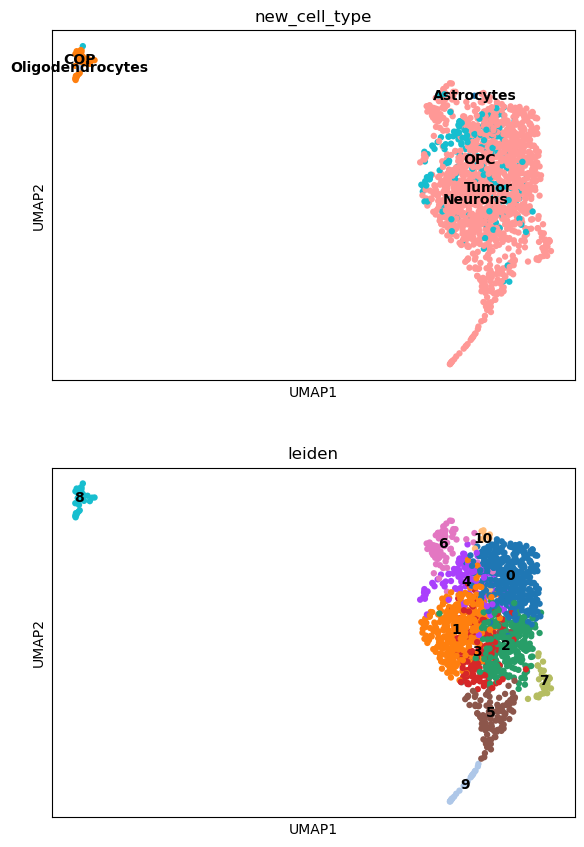

In [72]:
i = 11
print(adatas_annotated[i].obs.sample_info.unique())
sc.pl.umap(adatas_annotated[i], color = ['new_cell_type', 'leiden'], ncols = 1, legend_loc = 'on data')

In [73]:
labels = adatas_annotated[i].obs[['wb_anno', 'cellid_prediction', 'leiden', 'cell_type', 'old_cell_type']].groupby('leiden').agg(lambda x:x.mode())
scores = adatas_annotated[i].obs[['wb_conf_score', 'leiden']].groupby('leiden').agg(lambda x:x.mean())
last_check = labels.merge(right = scores, left_index=True, right_index=True)
last_check

,wb_anno,cellid_prediction,cell_type,old_cell_type,wb_conf_score
leiden,,,,,
0,326 OPC NN,unassigned,Tumor,"[], Categories (0, object): []",0.999482
1,326 OPC NN,unassigned,Tumor,"[], Categories (0, object): []",0.999586
2,326 OPC NN,unassigned,Tumor,"[], Categories (0, object): []",0.999567
3,326 OPC NN,unassigned,Tumor,"[], Categories (0, object): []",0.999302
4,326 OPC NN,unassigned,OPC,"[], Categories (0, object): []",0.999102
5,326 OPC NN,unassigned,Tumor,"[], Categories (0, object): []",0.999738
6,326 OPC NN,unassigned,Tumor,"[], Categories (0, object): []",0.998918
7,326 OPC NN,unassigned,Tumor,"[], Categories (0, object): []",0.917059
8,327 Oligo NN,unassigned,COP,"[], Categories (0, object): []",0.968871


In [74]:
for j in range(len(adatas_annotated[i].obs.leiden.unique())):
    print(f"'{j}' : '',")

'0' : '',
'1' : '',
'2' : '',
'3' : '',
'4' : '',
'5' : '',
'6' : '',
'7' : '',
'8' : '',
'9' : '',
'10' : '',


... storing 'each_cell_type' as categorical


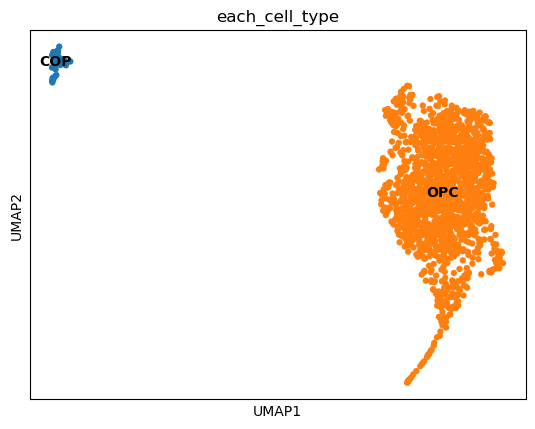

... storing 'each_cell_type' as categorical


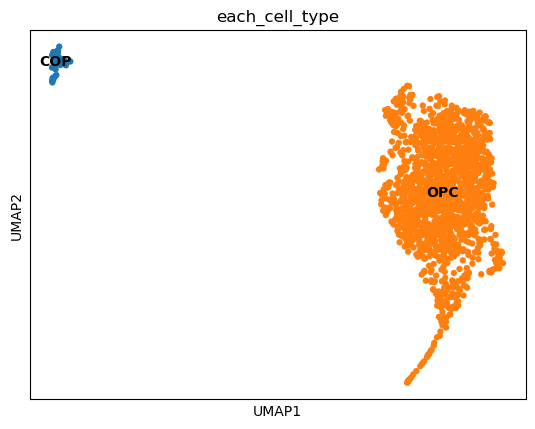

In [ ]:
cell_annotation = {
    '0' : 'OPC',
    '1' : 'OPC',
    '2' : 'OPC',
    '3' : 'OPC',
    '4' : 'OPC',
    '5' : 'OPC',
    '6' : 'OPC',
    '7' : 'OPC',
    '8' : 'COP',
    '9' : 'OPC',
    '10' : 'OPC',
}
adatas_annotated[i].obs['each_cell_type'] = adatas_annotated[i].obs.leiden.astype(str).map(cell_annotation)

sc.pl.umap(adatas_annotated[i], color = ['each_cell_type'], ncols = 1, legend_loc = 'on data')

In [ ]:
# with open('../output/5_each_annotated.pkl', 'wb') as f:
#     pickle.dump(adatas_annotated, f)

# Re-Annotate our samples
- i = 0, 1, 2, 3, 4
- CNV inference : CopyKAT, Infercnv, SCEVAN

In [8]:
with open('../output/5_each_annotated.pkl', 'rb') as f:
    adatas_annotated = pickle.load(f)

In [9]:
def make_count(adata):
    adata.X = adata.layers['counts'].copy()
    return adata

adatas_annotated = [make_count(adata) for adata in adatas_annotated]
adatas_annotated

[AnnData object with n_obs × n_vars = 8320 × 29009
     obs: 'sample_id', 'sample_info', 'age', 'sex', 'barcode', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'pct_counts_mt', 'pct_counts_ribo', 'pct_counts_hb', 'scDblFinder_score', 'scDblFinder_class', 'doublet_score', 'predicted_doublet', 'cell_type', 'grade', 'GFP', 'leiden_res1', 'wb_anno', 'wb_conf_score', 'cellid_prediction', 'leiden_res2', 'new_cell_type', 'old_cell_type', 'leiden', 'predicted_labels', 'conf_score'
     var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std', 'chromosome', 'start', 'end', 'gene_id', 'gene_name'
     uns: 'GFP_colors', 'leiden_res1', 'leiden_res2', 'log1p', 'neighbors', 'new_cell_type_colors', 'rank_genes_groups', 'umap', 'hvg', 'pca', 'leiden', 'leiden_colors'
     obsm: 'X_scVI', 'X_umap', 'X_pca'
     varm: 'PCs'
     layers: 'counts', 'log1p'
     obsp: 'connectivities', 'distances',
 A

### i = 0

['Mouse4']
Categories (1, object): ['Mouse4']


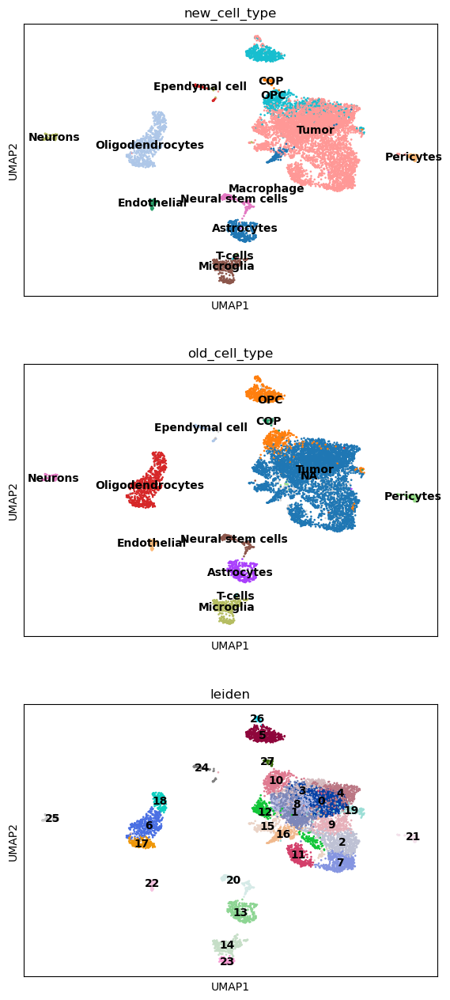

In [10]:
i = 0
print(adatas_annotated[i].obs.sample_info.unique())
sc.pl.umap(adatas_annotated[i], color = ['new_cell_type', 'old_cell_type', 'leiden'], ncols = 1, legend_loc = 'on data')

In [15]:
cnv.io.genomic_position_from_gtf('/home/jiehoonk/mnt/annotations/gencode.vM35.chr_patch_hapl_scaff.annotation.gtf', adatas_annotated[i])
cnv.tl.infercnv(adatas_annotated[i], reference_key = 'new_cell_type', reference_cat = ['Microglia', ])
cnv.tl.pca(adatas_annotated[i])
cnv.pp.neighbors(adatas_annotated[i])
cnv.tl.leiden(adatas_annotated[i])
cnv.tl.umap(adatas_annotated[i])
cnv.tl.cnv_score(adatas_annotated[i])

Extracted GTF attributes: ['gene_id', 'gene_type', 'gene_name', 'level', 'mgi_id', 'havana_gene', 'transcript_id', 'transcript_type', 'transcript_name', 'transcript_support_level', 'tag', 'havana_transcript', 'exon_number', 'exon_id', 'protein_id', 'ccdsid', 'ont']


  0%|          | 0/2 [00:00<?, ?it/s]

categories: 0, 1, 2, etc.
var_group_labels: chr1, chr2, chr3, etc.


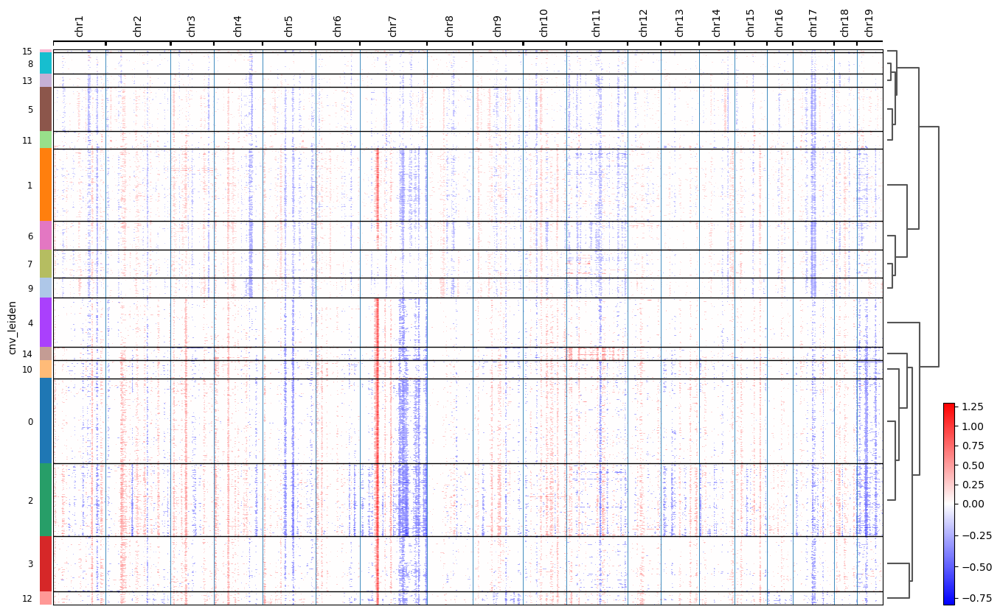

In [18]:
cnv.pl.chromosome_heatmap(adatas_annotated[i], groupby="cnv_leiden", dendrogram=True)

... storing 'gene_id_y' as categorical
... storing 'gene_name_y' as categorical
... storing 'gene_id' as categorical
... storing 'gene_name' as categorical


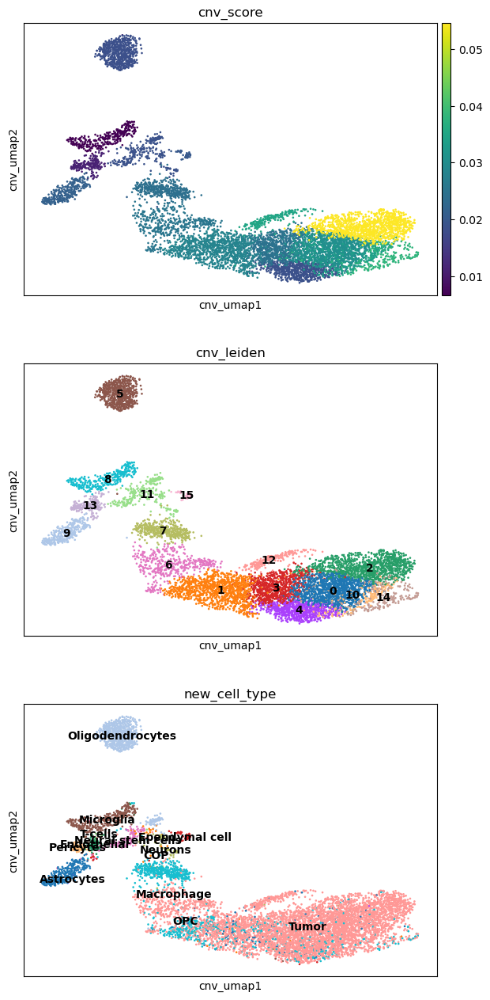

In [20]:
cnv.pl.umap(adatas_annotated[i], color = ['cnv_score', 'cnv_leiden', 'new_cell_type'], ncols = 1, legend_loc = 'on data')

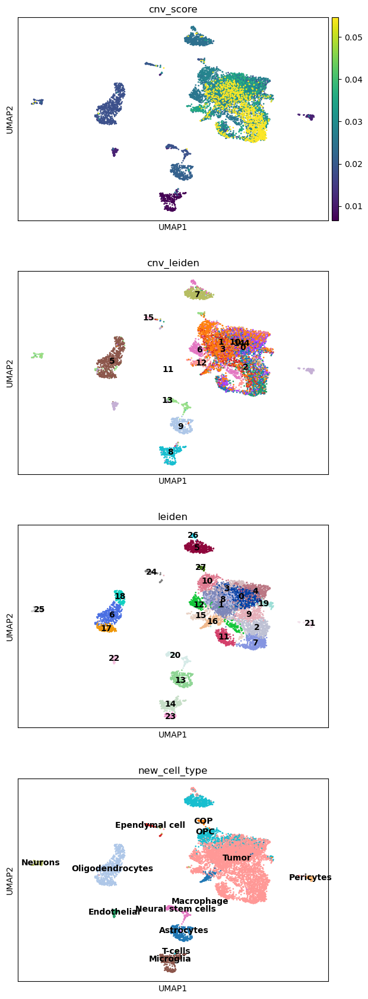

In [29]:
sc.pl.umap(adatas_annotated[i], color = ['cnv_score', 'cnv_leiden', 'leiden', 'new_cell_type'], ncols = 1, legend_loc = 'on data')

In [30]:
labels = adatas_annotated[i].obs[['wb_anno', 'cellid_prediction', 'leiden', 'cell_type', 'old_cell_type']].groupby('leiden').agg(lambda x:x.mode())
scores = adatas_annotated[i].obs[['wb_conf_score', 'leiden']].groupby('leiden').agg(lambda x:x.mean())
last_check = labels.merge(right = scores, left_index=True, right_index=True)
last_check

,wb_anno,cellid_prediction,cell_type,old_cell_type,wb_conf_score
leiden,,,,,
0,326 OPC NN,unassigned,Tumor,Tumor,0.699946
1,326 OPC NN,unassigned,Tumor,Tumor,0.530004
2,326 OPC NN,Cycling,Tumor,Tumor,0.690727
3,326 OPC NN,unassigned,Tumor,Tumor,0.855119
4,326 OPC NN,unassigned,Tumor,Tumor,0.546098
5,326 OPC NN,unassigned,OPC,OPC,0.931325
6,327 Oligo NN,Oligodendrocytes,Oligodendrocytes,Oligodendrocytes,0.999999
7,045 OB-STR-CTX Inh IMN|326 OPC NN,Cycling,Tumor,Tumor,0.894441
8,326 OPC NN,unassigned,Tumor,Tumor,0.750685


In [31]:
for j in range(len(adatas_annotated[i].obs.leiden.unique())):
    print(f"'{j}' : '',")

'0' : '',
'1' : '',
'2' : '',
'3' : '',
'4' : '',
'5' : '',
'6' : '',
'7' : '',
'8' : '',
'9' : '',
'10' : '',
'11' : '',
'12' : '',
'13' : '',
'14' : '',
'15' : '',
'16' : '',
'17' : '',
'18' : '',
'19' : '',
'20' : '',
'21' : '',
'22' : '',
'23' : '',
'24' : '',
'25' : '',
'26' : '',
'27' : '',


- first annotate suspicious tumor cells as OPC, then subcluster according to CNV score

... storing 'each_cell_type' as categorical


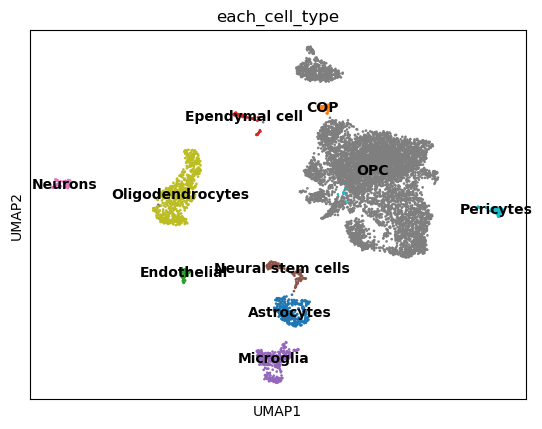

In [32]:
cell_annotation = {
    '0' : 'OPC',
    '1' : 'OPC',
    '2' : 'OPC',
    '3' : 'OPC',
    '4' : 'OPC',
    '5' : 'OPC',
    '6' : 'Oligodendrocytes',
    '7' : 'OPC',
    '8' : 'OPC',
    '9' : 'OPC',
    '10' : 'OPC',
    '11' : 'OPC',
    '12' : 'OPC',
    '13' : 'Astrocytes',
    '14' : 'Microglia',
    '15' : 'OPC',
    '16' : 'OPC',
    '17' : 'Oligodendrocytes',
    '18' : 'Oligodendrocytes',
    '19' : 'OPC',
    '20' : 'Neural stem cells',
    '21' : 'Pericytes',
    '22' : 'Endothelial',
    '23' : 'Microglia',
    '24' : 'Ependymal cell',
    '25' : 'Neurons',
    '26' : 'OPC',
    '27' : 'COP',
}
adatas_annotated[i].obs['each_cell_type'] = adatas_annotated[i].obs.leiden.astype(str).map(cell_annotation)

sc.pl.umap(adatas_annotated[i], color = ['each_cell_type'], ncols = 1, legend_loc = 'on data')

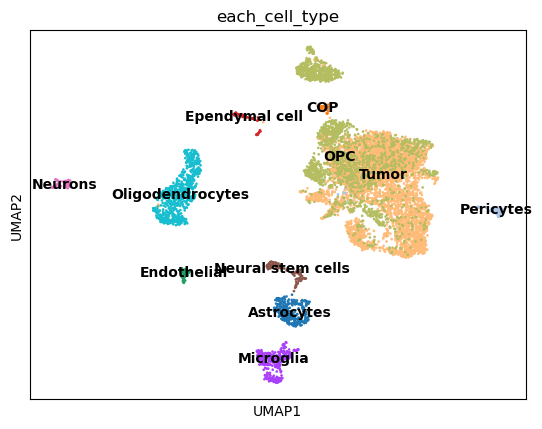

In [36]:
adatas_annotated[i].obs['each_cell_type'] = adatas_annotated[i].obs['each_cell_type'].cat.add_categories('Tumor')
adatas_annotated[i].obs.loc[adatas_annotated[i].obs.cnv_leiden.isin(['4', '14', '10', '0', '2', '3', '12']) & adatas_annotated[i].obs.each_cell_type.isin(['OPC']), 'each_cell_type'] = 'Tumor'
sc.pl.umap(adatas_annotated[i], color = ['each_cell_type'], ncols = 1, legend_loc = 'on data')

### i = 1

['Mouse1']
Categories (1, object): ['Mouse1']


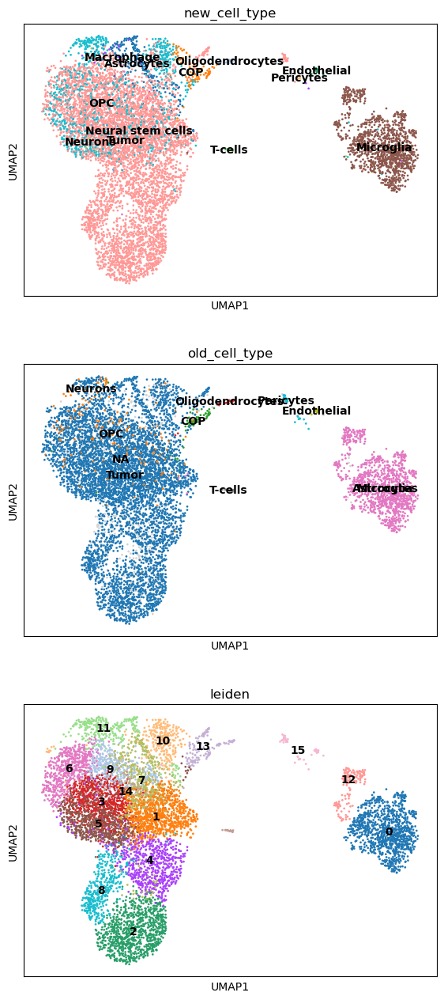

In [37]:
i = 1
print(adatas_annotated[i].obs.sample_info.unique())
sc.pl.umap(adatas_annotated[i], color = ['new_cell_type', 'old_cell_type', 'leiden'], ncols = 1, legend_loc = 'on data')

In [38]:
cnv.io.genomic_position_from_gtf('/home/jiehoonk/mnt/annotations/gencode.vM35.chr_patch_hapl_scaff.annotation.gtf', adatas_annotated[i])
cnv.tl.infercnv(adatas_annotated[i], reference_key = 'new_cell_type', reference_cat = ['Microglia', ])
cnv.tl.pca(adatas_annotated[i])
cnv.pp.neighbors(adatas_annotated[i])
cnv.tl.leiden(adatas_annotated[i])
cnv.tl.umap(adatas_annotated[i])
cnv.tl.cnv_score(adatas_annotated[i])

Extracted GTF attributes: ['gene_id', 'gene_type', 'gene_name', 'level', 'mgi_id', 'havana_gene', 'transcript_id', 'transcript_type', 'transcript_name', 'transcript_support_level', 'tag', 'havana_transcript', 'exon_number', 'exon_id', 'protein_id', 'ccdsid', 'ont']


  0%|          | 0/2 [00:00<?, ?it/s]

categories: 0, 1, 2, etc.
var_group_labels: chr1, chr2, chr3, etc.


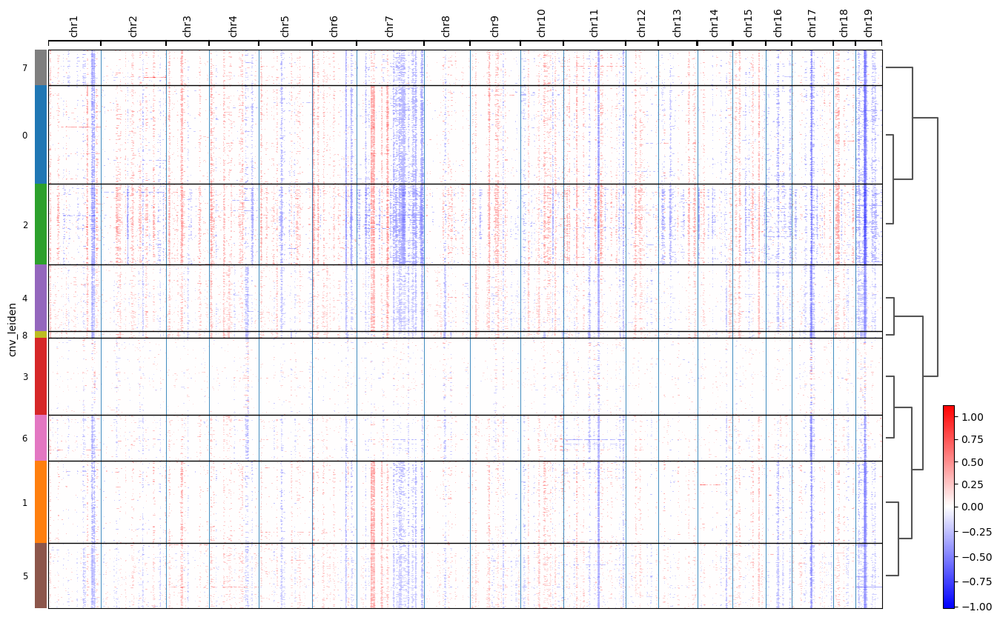

In [39]:
cnv.pl.chromosome_heatmap(adatas_annotated[i], groupby="cnv_leiden", dendrogram=True)

... storing 'gene_id' as categorical
... storing 'gene_name' as categorical


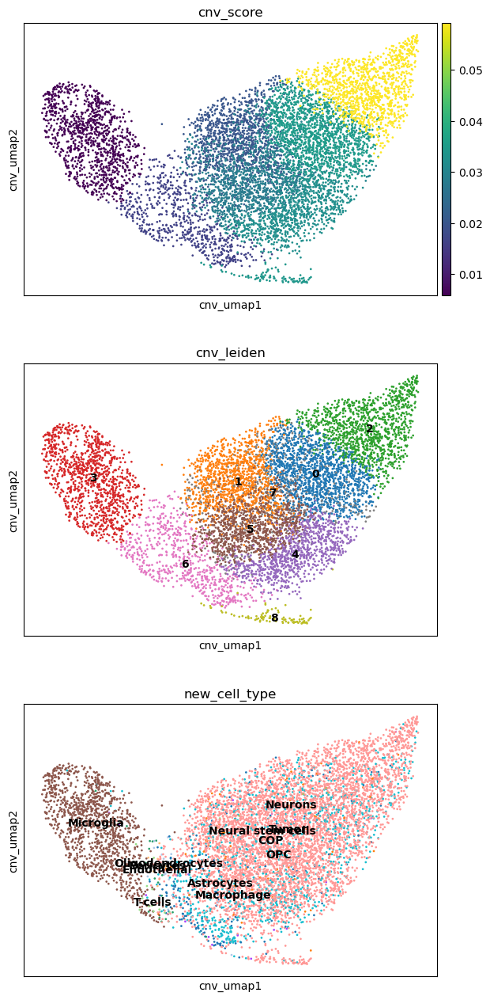

In [40]:
cnv.pl.umap(adatas_annotated[i], color = ['cnv_score', 'cnv_leiden', 'new_cell_type'], ncols = 1, legend_loc = 'on data')

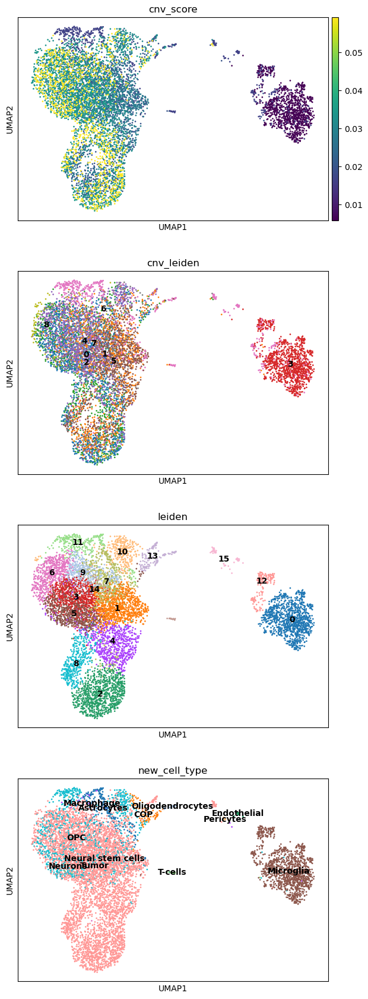

In [41]:
sc.pl.umap(adatas_annotated[i], color = ['cnv_score', 'cnv_leiden', 'leiden', 'new_cell_type'], ncols = 1, legend_loc = 'on data')

In [42]:
labels = adatas_annotated[i].obs[['wb_anno', 'cellid_prediction', 'leiden', 'cell_type', 'old_cell_type']].groupby('leiden').agg(lambda x:x.mode())
scores = adatas_annotated[i].obs[['wb_conf_score', 'leiden']].groupby('leiden').agg(lambda x:x.mean())
last_check = labels.merge(right = scores, left_index=True, right_index=True)
last_check

,wb_anno,cellid_prediction,cell_type,old_cell_type,wb_conf_score
leiden,,,,,
0,Unassigned,unassigned,Microglia,Microglia,0.832923
1,Unassigned,unassigned,Tumor,Tumor,0.432639
2,326 OPC NN,Cycling,Tumor,Tumor,0.784591
3,326 OPC NN,unassigned,Tumor,Tumor,0.748040
4,326 OPC NN,unassigned,Tumor,Tumor,0.644684
5,326 OPC NN,unassigned,Tumor,Tumor,0.670627
6,326 OPC NN,unassigned,Tumor,Tumor,0.867289
7,Unassigned,unassigned,Tumor,Tumor,0.373105
8,326 OPC NN,Cycling,Tumor,Tumor,0.757853


In [43]:
for j in range(len(adatas_annotated[i].obs.leiden.unique())):
    print(f"'{j}' : '',")

'0' : '',
'1' : '',
'2' : '',
'3' : '',
'4' : '',
'5' : '',
'6' : '',
'7' : '',
'8' : '',
'9' : '',
'10' : '',
'11' : '',
'12' : '',
'13' : '',
'14' : '',
'15' : '',


... storing 'each_cell_type' as categorical


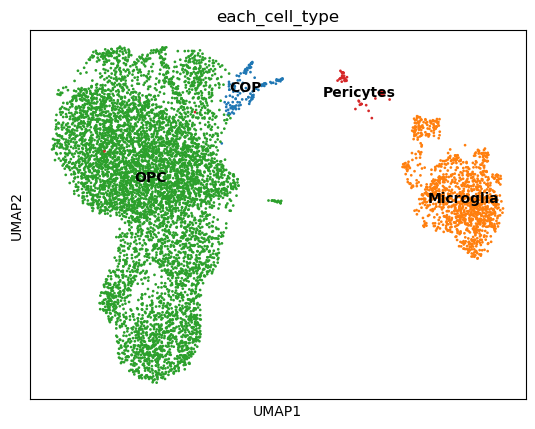

In [50]:
cell_annotation = {
    '0' : 'Microglia',
    '1' : 'OPC',
    '2' : 'OPC',
    '3' : 'OPC',
    '4' : 'OPC',
    '5' : 'OPC',
    '6' : 'OPC',
    '7' : 'OPC',
    '8' : 'OPC',
    '9' : 'OPC',
    '10' : 'OPC',
    '11' : 'OPC',
    '12' : 'Microglia',
    '13' : 'COP',
    '14' : 'OPC',
    '15' : 'Pericytes',
}
adatas_annotated[i].obs['each_cell_type'] = adatas_annotated[i].obs.leiden.astype(str).map(cell_annotation)

sc.pl.umap(adatas_annotated[i], color = ['each_cell_type'], ncols = 1, legend_loc = 'on data')

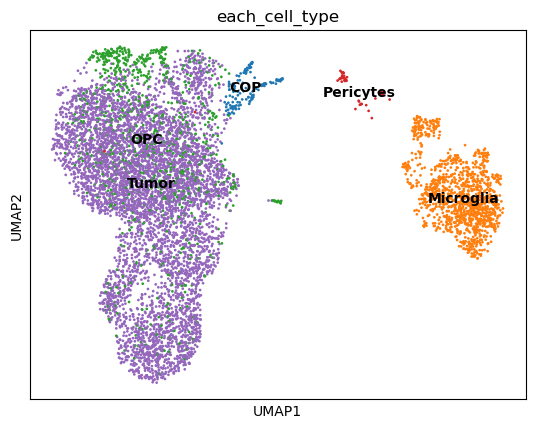

In [51]:
adatas_annotated[i].obs['each_cell_type'] = adatas_annotated[i].obs['each_cell_type'].cat.add_categories('Tumor')
adatas_annotated[i].obs.loc[adatas_annotated[i].obs.cnv_leiden.isin(['0', '2', '4', '8', '1', '5']) & adatas_annotated[i].obs.each_cell_type.isin(['OPC']), 'each_cell_type'] = 'Tumor'
sc.pl.umap(adatas_annotated[i], color = ['each_cell_type'], ncols = 1, legend_loc = 'on data')

### i = 2

['Mouse2']
Categories (1, object): ['Mouse2']


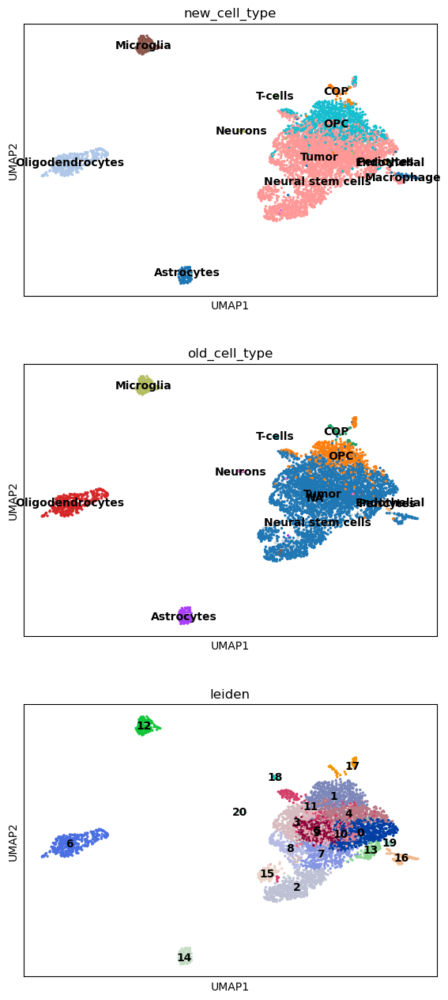

In [52]:
i = 2
print(adatas_annotated[i].obs.sample_info.unique())
sc.pl.umap(adatas_annotated[i], color = ['new_cell_type', 'old_cell_type', 'leiden'], ncols = 1, legend_loc = 'on data')

In [53]:
cnv.io.genomic_position_from_gtf('/home/jiehoonk/mnt/annotations/gencode.vM35.chr_patch_hapl_scaff.annotation.gtf', adatas_annotated[i])
cnv.tl.infercnv(adatas_annotated[i], reference_key = 'new_cell_type', reference_cat = ['Microglia', ])
cnv.tl.pca(adatas_annotated[i])
cnv.pp.neighbors(adatas_annotated[i])
cnv.tl.leiden(adatas_annotated[i])
cnv.tl.umap(adatas_annotated[i])
cnv.tl.cnv_score(adatas_annotated[i])

Extracted GTF attributes: ['gene_id', 'gene_type', 'gene_name', 'level', 'mgi_id', 'havana_gene', 'transcript_id', 'transcript_type', 'transcript_name', 'transcript_support_level', 'tag', 'havana_transcript', 'exon_number', 'exon_id', 'protein_id', 'ccdsid', 'ont']


  0%|          | 0/1 [00:00<?, ?it/s]

categories: 0, 1, 2, etc.
var_group_labels: chr1, chr2, chr3, etc.


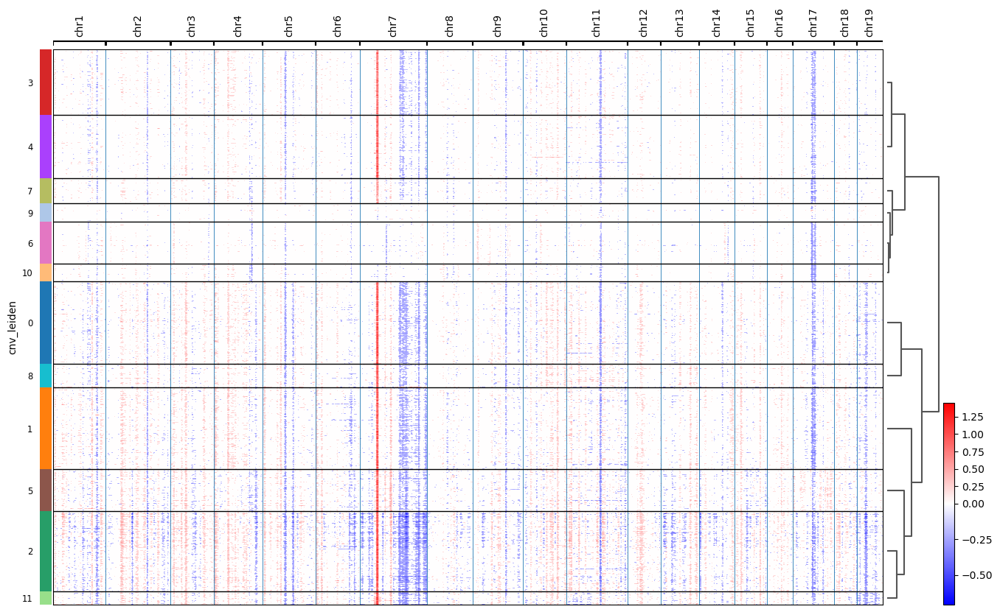

In [54]:
cnv.pl.chromosome_heatmap(adatas_annotated[i], groupby="cnv_leiden", dendrogram=True)

... storing 'gene_id' as categorical
... storing 'gene_name' as categorical


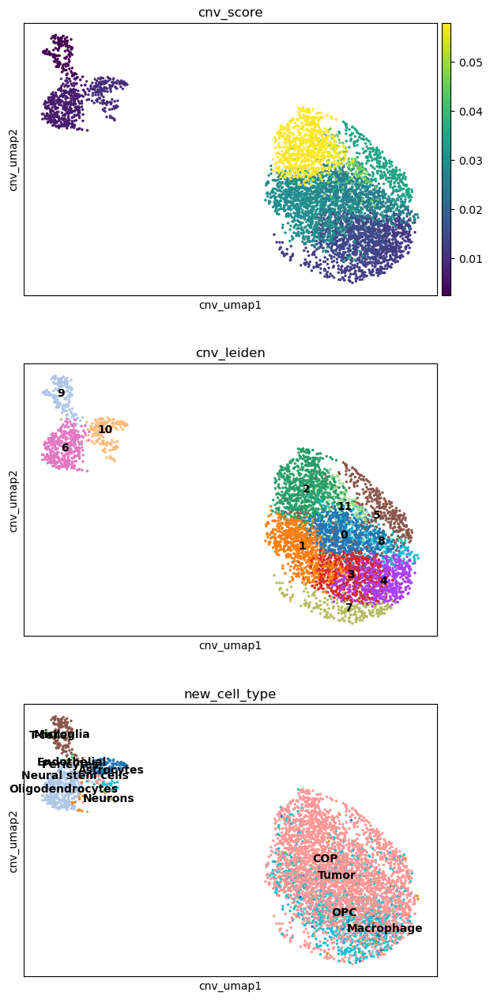

In [55]:
cnv.pl.umap(adatas_annotated[i], color = ['cnv_score', 'cnv_leiden', 'new_cell_type'], ncols = 1, legend_loc = 'on data')

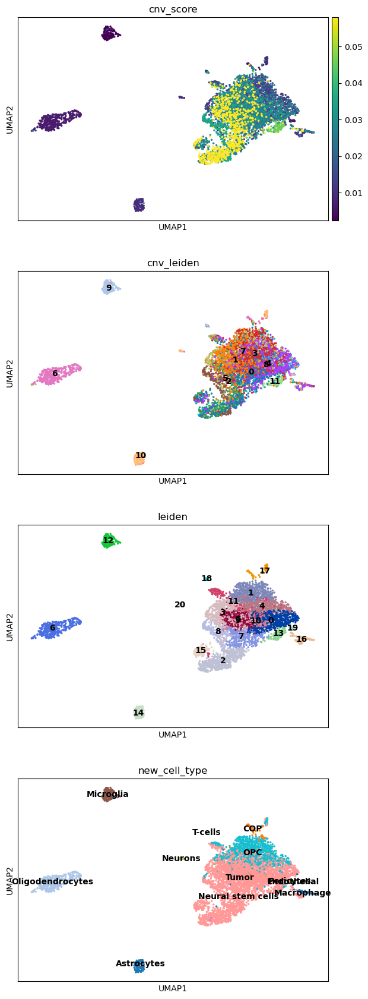

In [56]:
sc.pl.umap(adatas_annotated[i], color = ['cnv_score', 'cnv_leiden', 'leiden', 'new_cell_type'], ncols = 1, legend_loc = 'on data')

In [57]:
labels = adatas_annotated[i].obs[['wb_anno', 'cellid_prediction', 'leiden', 'cell_type', 'old_cell_type']].groupby('leiden').agg(lambda x:x.mode())
scores = adatas_annotated[i].obs[['wb_conf_score', 'leiden']].groupby('leiden').agg(lambda x:x.mean())
last_check = labels.merge(right = scores, left_index=True, right_index=True)
last_check

,wb_anno,cellid_prediction,cell_type,old_cell_type,wb_conf_score
leiden,,,,,
0,326 OPC NN,unassigned,Tumor,Tumor,0.602747
1,326 OPC NN,unassigned,OPC,OPC,0.674721
2,045 OB-STR-CTX Inh IMN|326 OPC NN,Cycling,Tumor,Tumor,0.881641
3,326 OPC NN,unassigned,Tumor,Tumor,0.772880
4,326 OPC NN,unassigned,OPC,Tumor,0.743721
5,326 OPC NN,unassigned,Tumor,Tumor,0.835795
6,327 Oligo NN,Oligodendrocytes,Oligodendrocytes,Oligodendrocytes,0.999855
7,326 OPC NN,unassigned,Tumor,Tumor,0.773857
8,326 OPC NN,unassigned,Tumor,Tumor,0.769744


In [58]:
for j in range(len(adatas_annotated[i].obs.leiden.unique())):
    print(f"'{j}' : '',")

'0' : '',
'1' : '',
'2' : '',
'3' : '',
'4' : '',
'5' : '',
'6' : '',
'7' : '',
'8' : '',
'9' : '',
'10' : '',
'11' : '',
'12' : '',
'13' : '',
'14' : '',
'15' : '',
'16' : '',
'17' : '',
'18' : '',
'19' : '',
'20' : '',


... storing 'each_cell_type' as categorical


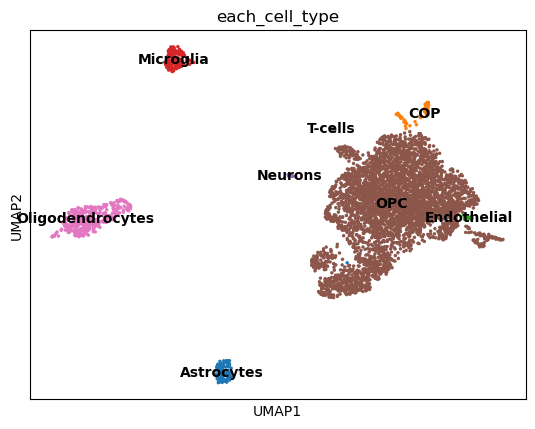

In [60]:
cell_annotation = {
    '0' : 'OPC',
    '1' : 'OPC',
    '2' : 'OPC',
    '3' : 'OPC',
    '4' : 'OPC',
    '5' : 'OPC',
    '6' : 'Oligodendrocytes',
    '7' : 'OPC',
    '8' : 'OPC',
    '9' : 'OPC',
    '10' : 'OPC',
    '11' : 'OPC',
    '12' : 'Microglia',
    '13' : 'OPC',
    '14' : 'Astrocytes',
    '15' : 'OPC',
    '16' : 'OPC',
    '17' : 'COP',
    '18' : 'T-cells',
    '19' : 'Endothelial',
    '20' : 'Neurons',

}
adatas_annotated[i].obs['each_cell_type'] = adatas_annotated[i].obs.leiden.astype(str).map(cell_annotation)

sc.pl.umap(adatas_annotated[i], color = ['each_cell_type'], ncols = 1, legend_loc = 'on data')

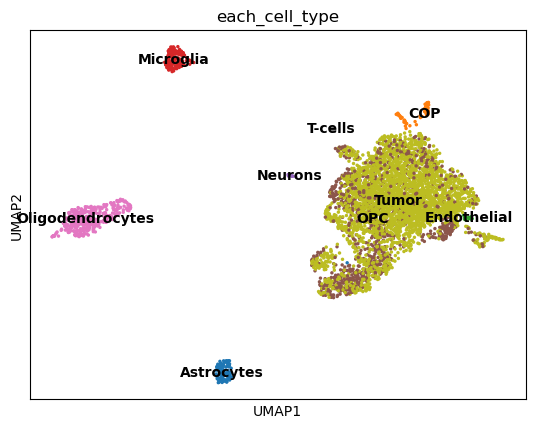

In [61]:
adatas_annotated[i].obs['each_cell_type'] = adatas_annotated[i].obs['each_cell_type'].cat.add_categories('Tumor')
adatas_annotated[i].obs.loc[adatas_annotated[i].obs.cnv_leiden.isin(['3', '4', '0', '8', '1', '5', '2' '11']) & adatas_annotated[i].obs.each_cell_type.isin(['OPC']), 'each_cell_type'] = 'Tumor'
sc.pl.umap(adatas_annotated[i], color = ['each_cell_type'], ncols = 1, legend_loc = 'on data')

### i = 3

['Mouse3']
Categories (1, object): ['Mouse3']


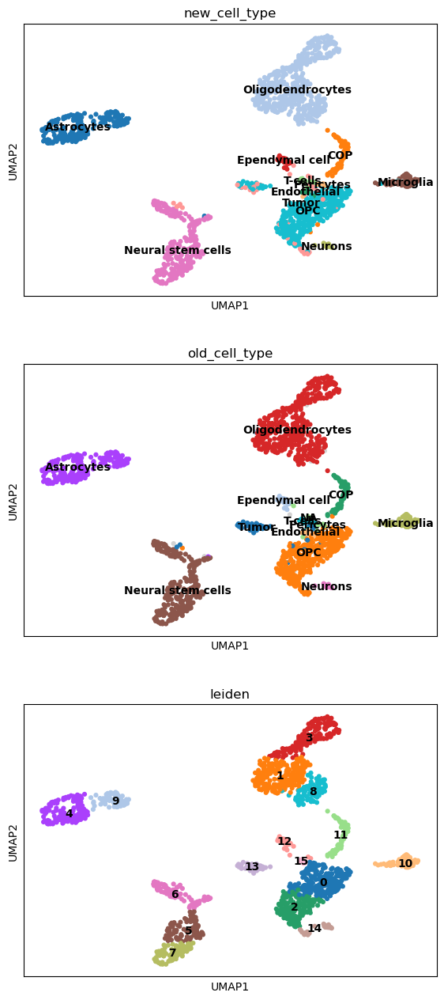

In [62]:
i = 3
print(adatas_annotated[i].obs.sample_info.unique())
sc.pl.umap(adatas_annotated[i], color = ['new_cell_type', 'old_cell_type', 'leiden'], ncols = 1, legend_loc = 'on data')

In [63]:
cnv.io.genomic_position_from_gtf('/home/jiehoonk/mnt/annotations/gencode.vM35.chr_patch_hapl_scaff.annotation.gtf', adatas_annotated[i])
cnv.tl.infercnv(adatas_annotated[i], reference_key = 'new_cell_type', reference_cat = ['Microglia', ])
cnv.tl.pca(adatas_annotated[i])
cnv.pp.neighbors(adatas_annotated[i])
cnv.tl.leiden(adatas_annotated[i])
cnv.tl.umap(adatas_annotated[i])
cnv.tl.cnv_score(adatas_annotated[i])

Extracted GTF attributes: ['gene_id', 'gene_type', 'gene_name', 'level', 'mgi_id', 'havana_gene', 'transcript_id', 'transcript_type', 'transcript_name', 'transcript_support_level', 'tag', 'havana_transcript', 'exon_number', 'exon_id', 'protein_id', 'ccdsid', 'ont']


  0%|          | 0/1 [00:00<?, ?it/s]

categories: 0, 1, 2, etc.
var_group_labels: chr1, chr2, chr3, etc.


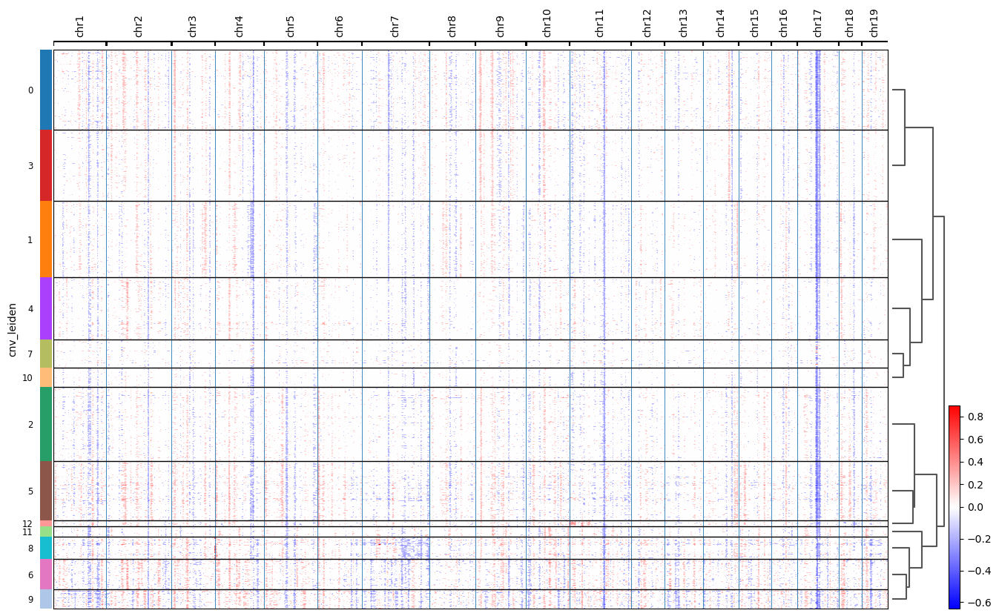

In [64]:
cnv.pl.chromosome_heatmap(adatas_annotated[i], groupby="cnv_leiden", dendrogram=True)

... storing 'gene_id' as categorical
... storing 'gene_name' as categorical


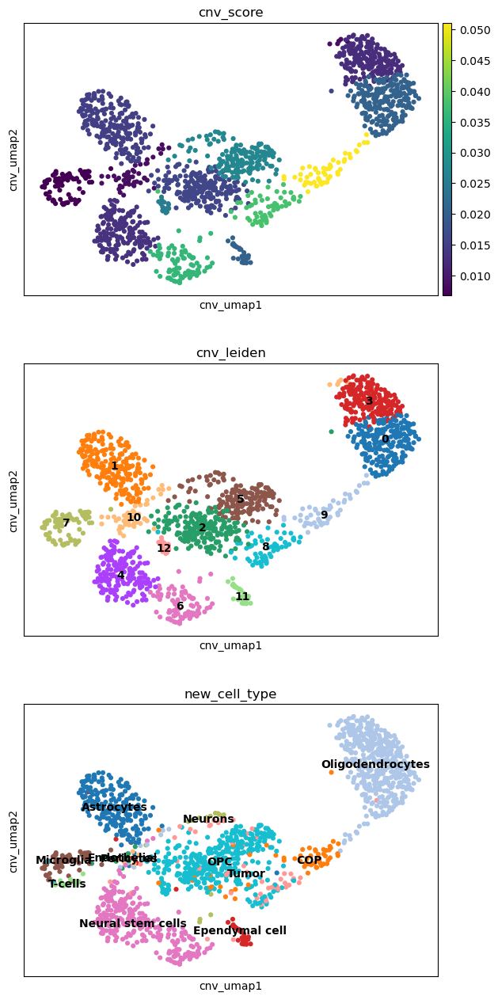

In [65]:
cnv.pl.umap(adatas_annotated[i], color = ['cnv_score', 'cnv_leiden', 'new_cell_type'], ncols = 1, legend_loc = 'on data')

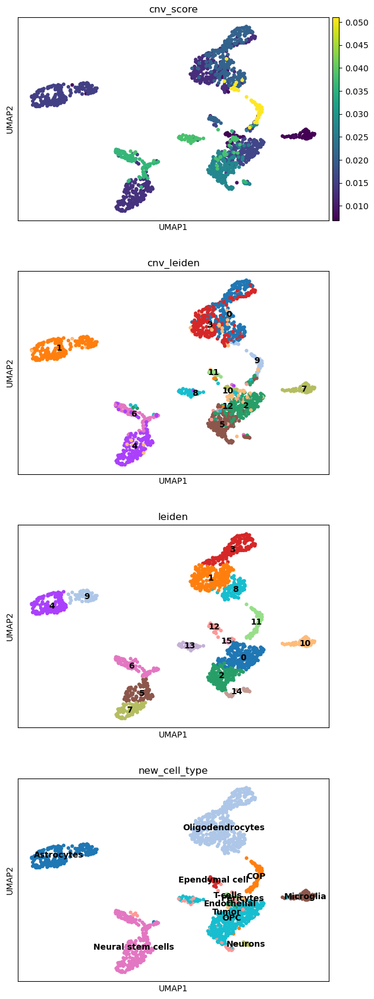

In [66]:
sc.pl.umap(adatas_annotated[i], color = ['cnv_score', 'cnv_leiden', 'leiden', 'new_cell_type'], ncols = 1, legend_loc = 'on data')

In [67]:
labels = adatas_annotated[i].obs[['wb_anno', 'cellid_prediction', 'leiden', 'cell_type', 'old_cell_type']].groupby('leiden').agg(lambda x:x.mode())
scores = adatas_annotated[i].obs[['wb_conf_score', 'leiden']].groupby('leiden').agg(lambda x:x.mean())
last_check = labels.merge(right = scores, left_index=True, right_index=True)
last_check

,wb_anno,cellid_prediction,cell_type,old_cell_type,wb_conf_score
leiden,,,,,
0,326 OPC NN,unassigned,OPC,OPC,0.874000
1,327 Oligo NN,Oligodendrocytes,Oligodendrocytes,Oligodendrocytes,0.996831
2,326 OPC NN,unassigned,OPC,OPC,0.949767
3,327 Oligo NN,Oligodendrocytes,Oligodendrocytes,Oligodendrocytes,0.999991
4,319 Astro-TE NN,Astrocytes,Astrocytes,Astrocytes,0.910975
5,045 OB-STR-CTX Inh IMN,unassigned,Neural stem cells,Neural stem cells,0.991785
6,045 OB-STR-CTX Inh IMN,unassigned,Neural stem cells,Neural stem cells,0.953290
7,045 OB-STR-CTX Inh IMN,unassigned,Neural stem cells,Neural stem cells,0.999127
8,327 Oligo NN,Oligodendrocytes,Oligodendrocytes,Oligodendrocytes,0.999806


In [68]:
for j in range(len(adatas_annotated[i].obs.leiden.unique())):
    print(f"'{j}' : '',")

'0' : '',
'1' : '',
'2' : '',
'3' : '',
'4' : '',
'5' : '',
'6' : '',
'7' : '',
'8' : '',
'9' : '',
'10' : '',
'11' : '',
'12' : '',
'13' : '',
'14' : '',
'15' : '',


... storing 'each_cell_type' as categorical


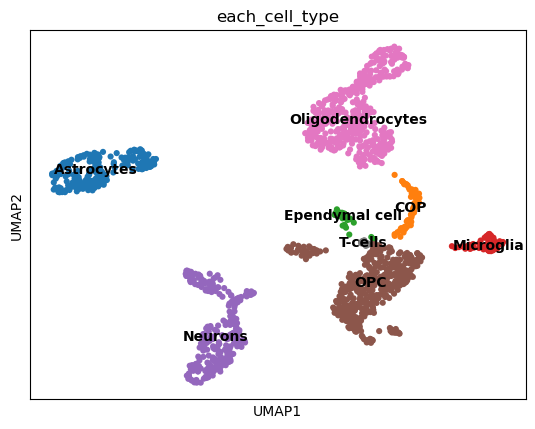

In [69]:
cell_annotation = {
    '0' : 'OPC',
    '1' : 'Oligodendrocytes',
    '2' : 'OPC',
    '3' : 'Oligodendrocytes',
    '4' : 'Astrocytes',
    '5' : 'Neurons',
    '6' : 'Neurons',
    '7' : 'Neurons',
    '8' : 'Oligodendrocytes',
    '9' : 'Astrocytes',
    '10' : 'Microglia',
    '11' : 'COP',
    '12' : 'Ependymal cell',
    '13' : 'OPC',
    '14' : 'OPC',
    '15' : 'T-cells',
}
adatas_annotated[i].obs['each_cell_type'] = adatas_annotated[i].obs.leiden.astype(str).map(cell_annotation)

sc.pl.umap(adatas_annotated[i], color = ['each_cell_type'], ncols = 1, legend_loc = 'on data')

### i = 4

['Control']
Categories (1, object): ['Control']


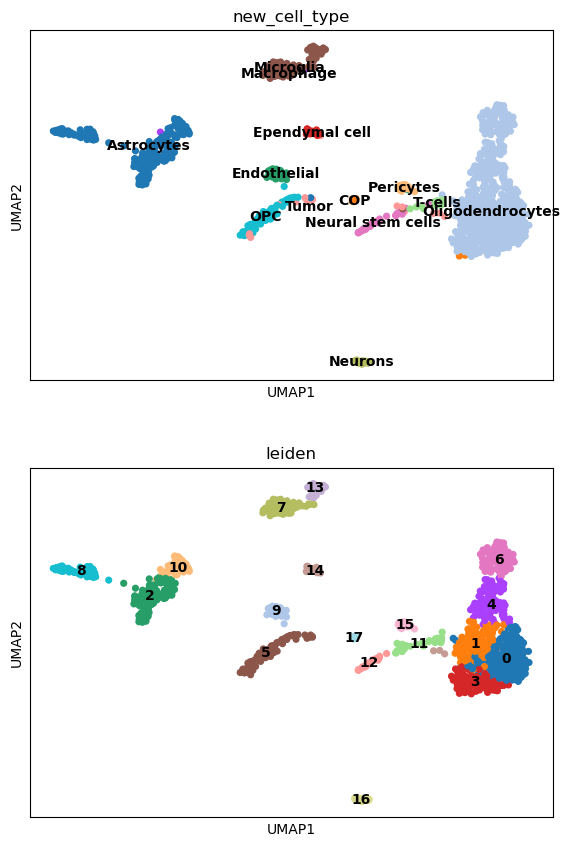

In [70]:
i = 4
print(adatas_annotated[i].obs.sample_info.unique())
sc.pl.umap(adatas_annotated[i], color = ['new_cell_type', 'leiden'], ncols = 1, legend_loc = 'on data')

In [71]:
labels = adatas_annotated[i].obs[['wb_anno', 'cellid_prediction', 'leiden', 'cell_type', 'old_cell_type']].groupby('leiden').agg(lambda x:x.mode())
scores = adatas_annotated[i].obs[['wb_conf_score', 'leiden']].groupby('leiden').agg(lambda x:x.mean())
last_check = labels.merge(right = scores, left_index=True, right_index=True)
last_check

,wb_anno,cellid_prediction,cell_type,old_cell_type,wb_conf_score
leiden,,,,,
0,327 Oligo NN,Oligodendrocytes,Oligodendrocytes,Oligodendrocytes,0.997788
1,327 Oligo NN,Oligodendrocytes,Oligodendrocytes,Oligodendrocytes,0.999917
2,319 Astro-TE NN,Astrocytes,Astrocytes,Astrocytes,0.926891
3,327 Oligo NN,Oligodendrocytes,Oligodendrocytes,Oligodendrocytes,0.999998
4,327 Oligo NN,Oligodendrocytes,Oligodendrocytes,Oligodendrocytes,1.000000
5,326 OPC NN,unassigned,OPC,OPC,0.917548
6,327 Oligo NN,Oligodendrocytes,Oligodendrocytes,Oligodendrocytes,0.983110
7,334 Microglia NN,Microglia,Microglia,Microglia,0.912826
8,318 Astro-NT NN,Astrocytes,Astrocytes,Astrocytes,0.710419


In [72]:
for j in range(len(adatas_annotated[i].obs.leiden.unique())):
    print(f"'{j}' : '',")

'0' : '',
'1' : '',
'2' : '',
'3' : '',
'4' : '',
'5' : '',
'6' : '',
'7' : '',
'8' : '',
'9' : '',
'10' : '',
'11' : '',
'12' : '',
'13' : '',
'14' : '',
'15' : '',
'16' : '',
'17' : '',


... storing 'each_cell_type' as categorical


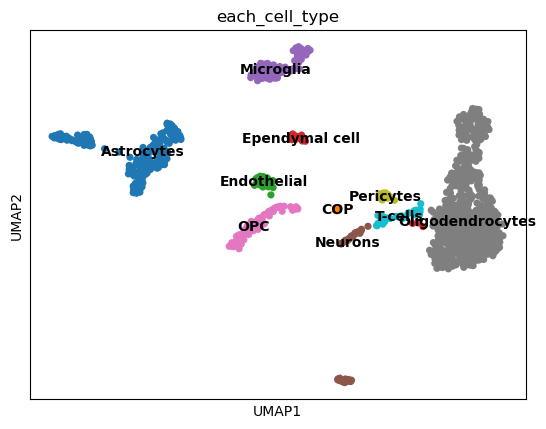

In [73]:
cell_annotation = {
    '0' : 'Oligodendrocytes',
    '1' : 'Oligodendrocytes',
    '2' : 'Astrocytes',
    '3' : 'Oligodendrocytes',
    '4' : 'Oligodendrocytes',
    '5' : 'OPC',
    '6' : 'Oligodendrocytes',
    '7' : 'Microglia',
    '8' : 'Astrocytes',
    '9' : 'Endothelial',
    '10' : 'Astrocytes',
    '11' : 'T-cells',
    '12' : 'Neurons',
    '13' : 'Microglia',
    '14' : 'Ependymal cell',
    '15' : 'Pericytes',
    '16' : 'Neurons',
    '17' : 'COP',
}
adatas_annotated[i].obs['each_cell_type'] = adatas_annotated[i].obs.leiden.astype(str).map(cell_annotation)

sc.pl.umap(adatas_annotated[i], color = ['each_cell_type'], ncols = 1, legend_loc = 'on data')

In [74]:
with open('../output/6_each_annotated_cnv.pkl', 'wb') as f:
    pickle.dump(adatas_annotated, f)

In [75]:
adata = sc.concat(adatas_annotated)
adata

AnnData object with n_obs × n_vars = 53408 × 29009
    obs: 'sample_id', 'sample_info', 'age', 'sex', 'barcode', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'pct_counts_mt', 'pct_counts_ribo', 'pct_counts_hb', 'scDblFinder_score', 'scDblFinder_class', 'doublet_score', 'predicted_doublet', 'cell_type', 'grade', 'GFP', 'leiden_res1', 'wb_anno', 'wb_conf_score', 'cellid_prediction', 'leiden_res2', 'new_cell_type', 'old_cell_type', 'leiden', 'predicted_labels', 'conf_score', 'each_cell_type'
    obsm: 'X_scVI', 'X_umap', 'X_pca'
    layers: 'counts', 'log1p'

In [78]:
adata.write('../output/7_annotated_cnv.h5ad')

# Check

In [3]:
adata = sc.read_h5ad('../output/7_annotated_cnv.h5ad')
adata

AnnData object with n_obs × n_vars = 53408 × 29009
    obs: 'sample_id', 'sample_info', 'age', 'sex', 'barcode', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'pct_counts_mt', 'pct_counts_ribo', 'pct_counts_hb', 'scDblFinder_score', 'scDblFinder_class', 'doublet_score', 'predicted_doublet', 'cell_type', 'grade', 'GFP', 'leiden_res1', 'wb_anno', 'wb_conf_score', 'cellid_prediction', 'leiden_res2', 'new_cell_type', 'old_cell_type', 'leiden', 'predicted_labels', 'conf_score', 'each_cell_type'
    uns: 'each_cell_type_colors'
    obsm: 'X_pca', 'X_scVI', 'X_umap'
    layers: 'counts', 'log1p'

In [6]:
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata)
sc.tl.pca(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)


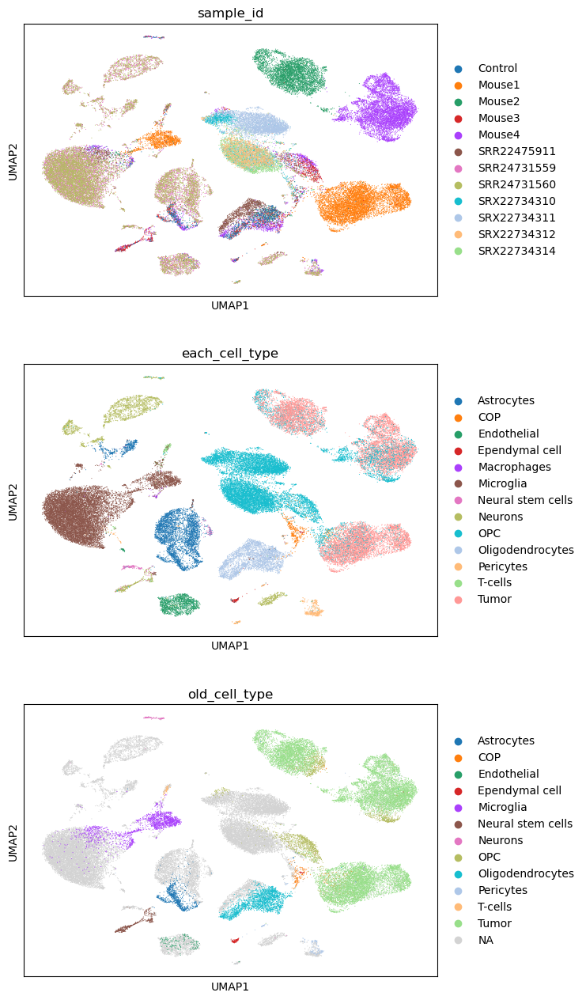

In [8]:
sc.pl.umap(adata, color = ['sample_id', 'each_cell_type', 'old_cell_type'], ncols = 1)

In [11]:
sc.tl.leiden(adata, resolution = 2)

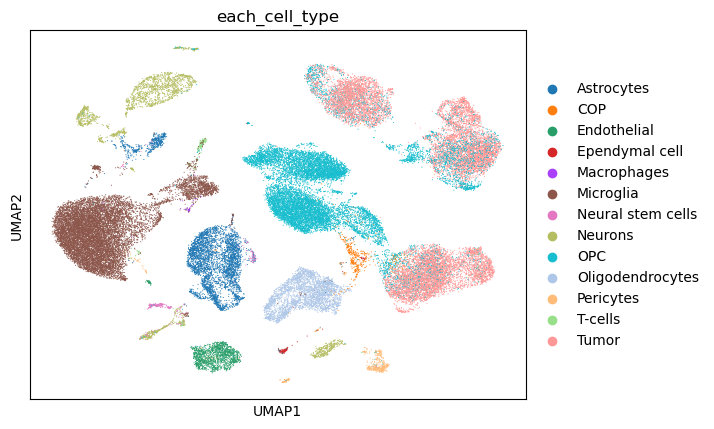

In [16]:
sc.pl.umap(adata, color = ['each_cell_type'])

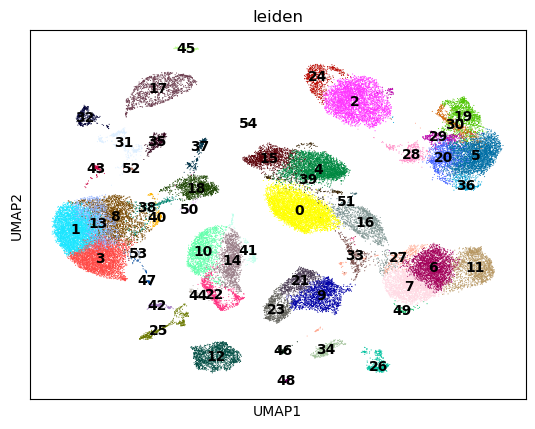

In [17]:
sc.pl.umap(adata, color = ['leiden'], legend_loc = 'on data')

In [20]:
labels = adata.obs[['wb_anno', 'cellid_prediction', 'leiden', 'cell_type', 'old_cell_type', 'each_cell_type']].groupby('leiden').agg(lambda x:x.mode())
scores = adata.obs[['wb_conf_score', 'leiden']].groupby('leiden').agg(lambda x:x.mean())
last_check = labels.merge(right = scores, left_index=True, right_index=True)
last_check

,wb_anno,cellid_prediction,cell_type,old_cell_type,each_cell_type,wb_conf_score
leiden,,,,,,
0,326 OPC NN,unassigned,Tumor,OPC,OPC,0.991767
1,334 Microglia NN,Microglia,Microglia,Microglia,Microglia,0.973736
2,326 OPC NN,unassigned,Tumor,Tumor,Tumor,0.720262
3,334 Microglia NN,unassigned,Microglia,Microglia,Microglia,0.880766
4,326 OPC NN,unassigned,OPC,"[], Categories (12, object): ['Astrocytes', 'C...",OPC,0.920819
5,326 OPC NN,unassigned,Tumor,Tumor,Tumor,0.671767
6,Unassigned,unassigned,Tumor,Tumor,Tumor,0.526862
7,326 OPC NN,unassigned,Tumor,Tumor,Tumor,0.823464
8,334 Microglia NN,unassigned,Microglia,Microglia,Microglia,0.972840


In [21]:
cell_annotation = {
    '0' : 'OPC',
    '1' : 'Microglia',
    '2' : 'Tumor',
    '3' : 'Microglia',
    '4' : 'OPC',
    '5' : 'Tumor',
    '6' : 'Tumor',
    '7' : 'Tumor',
    '8' : 'Microglia',
    '9' : 'Oligodendrocytes',
    '10' : 'Astrocytes',
    '11' : 'Tumor',
    '12' : 'Endothelial',
    '13' : 'Microglia',
    '14' : 'Astrocytes',
    '15' : 'OPC',
    '16' : 'OPC',
    '17' : 'Neurons',
    '18' : 'Microglia',
    '19' : 'Tumor',
    '20' : 'Tumor',
    '21' : 'Oligodendrocytes',
    '22' : 'Astrocytes',
    '23' : 'Oligodendrocytes',
    '24' : 'Tumor',
    '25' : 'Neurons',
    '26' : 'Pericytes',
    '27' : 'Tumor',
    '28' : 'Tumor',
    '29' : 'Tumor',
    '30' : 'Tumor',
    '31' : 'Macrophage',
    '32' : 'Neurons',
    '33' : 'COP',
    '34' : 'Neurons',
    '35' : 'Astrocytes',
    '36' : 'Tumor',
    '37' : 'T-cells',
    '38' : 'Microglia',
    '39' : 'OPC',
    '40' : 'Microglia',
    '41' : 'Astrocytes',
    '42' : 'Neural stem cells',
    '43' : 'Microglia',
    '44' : 'Astrocytes',
    '45' : 'Neurons',
    '46' : 'Ependymal cell',
    '47' : 'Endothelial',
    '48' : 'Pericytes',
    '49' : 'Tumor',
    '50' : 'Microglia',
    '51' : 'OPC',
    '52' : 'Microglia',
    '53' : 'T-cells',
    '54' : 'OPC',
}

In [23]:
adata.obs['cell_type'] = adata.obs.leiden.astype(str).map(cell_annotation)

... storing 'cell_type' as categorical
... storing 'each_cell_type' as categorical


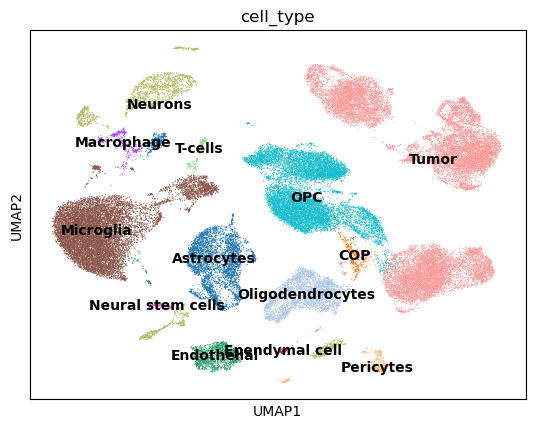

In [24]:
sc.pl.umap(adata, color = ['cell_type'], ncols = 1, legend_loc = 'on data')

In [25]:
adata.write('../output/7_annotated_cnv_re.h5ad')

# Re-train with scANVI
- retrain with HVG 3000 with `scANVI`
- run with L4 (python 3.11, Pytorch 2.4)

In [1]:
!pip install scanpy scikit-misc scvi-tools mplscience igraph leidenalg

  Preparing metadata (setup.py) ... done
INFO: pip is looking at multiple versions of orbax-checkpoint to determine which version is compatible with other requirements. This could take a while.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 1.6 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 1.6 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 2.7 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 214.5 kB/s eta 0:00:0000:0100:02
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 146.6 kB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 87.3/87.3 MB 2.8 MB/s eta 0:00:0000:0100:010m
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 815.2/815.2 kB 10.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.6/8.6 MB 11.6 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.8/3.8 MB 12.0 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [2]:
import os
os.chdir('/workspace')
import gc
import warnings
warnings.filterwarnings("ignore")

# single cell pipelines
import scanpy as sc
import numpy as np
import pandas as pd

import seaborn as sns
import matplotlib.pyplot as plt
import mplscience

# scvi-tools
import scvi
import torch

print(scvi.__version__)
sc.logging.print_header()

np.random.seed(777)
torch.manual_seed(777)
scvi.settings.seed = 777

torch.set_float32_matmul_precision("high")

Seed set to 777


1.3.0


In [3]:
adata = sc.read_h5ad('7_annotated_cnv_re.h5ad')
adata

AnnData object with n_obs × n_vars = 53408 × 29009
    obs: 'sample_id', 'sample_info', 'age', 'sex', 'barcode', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'pct_counts_mt', 'pct_counts_ribo', 'pct_counts_hb', 'scDblFinder_score', 'scDblFinder_class', 'doublet_score', 'predicted_doublet', 'cell_type', 'grade', 'GFP', 'leiden_res1', 'wb_anno', 'wb_conf_score', 'cellid_prediction', 'leiden_res2', 'new_cell_type', 'old_cell_type', 'leiden', 'predicted_labels', 'conf_score', 'each_cell_type'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'cell_type_colors', 'each_cell_type_colors', 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'old_cell_type_colors', 'pca', 'sample_id_colors', 'umap'
    obsm: 'X_pca', 'X_scVI', 'X_umap'
    varm: 'PCs'
    layers: 'counts', 'log1p'
    obsp: 'connectivities', 'distances'

In [5]:
adata.X = adata.layers['counts'].copy()

In [7]:
sc.pp.highly_variable_genes(adata, n_top_genes = 3000, subset = True, layer = 'counts', flavor = 'seurat_v3', batch_key = 'sample_id') 

In [8]:
scvi.model.SCVI.setup_anndata(adata, layer = 'counts', batch_key='sample_id', continuous_covariate_keys=['pct_counts_mt', 'pct_counts_ribo'])
model_tuned = scvi.model.SCVI(adata, gene_likelihood='zinb', n_hidden=192, n_latent=30, n_layers=2, dropout_rate=0.5)  

In [9]:
model_tuned.train(early_stopping=True, plan_kwargs={"lr": 0.0027},)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training:   0%|          | 0/150 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=150` reached.


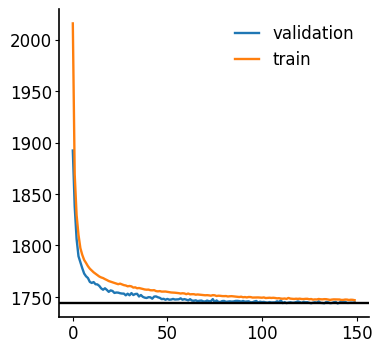

In [10]:
with mplscience.style_context():
    y = model_tuned.history['reconstruction_loss_validation']['reconstruction_loss_validation'].min()
    plt.plot(model_tuned.history['reconstruction_loss_validation']['reconstruction_loss_validation'], label = 'validation')
    plt.plot(model_tuned.history['reconstruction_loss_train']['reconstruction_loss_train'], label = 'train')

    plt.axhline(y, c = 'k')
    plt.legend()
    plt.show()

In [14]:
scanvi_model = scvi.model.SCANVI.from_scvi_model(scvi_model= model_tuned, adata = adata, labels_key = 'cell_type', unlabeled_category='unlabelled')

In [15]:
scanvi_model.train(max_epochs = 20, check_val_every_n_epoch=1, early_stopping = True, early_stopping_patience=5, plan_kwargs= {"lr":1e-3})

INFO     Training for 20 epochs.                                                                                   


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training:   0%|          | 0/20 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=20` reached.


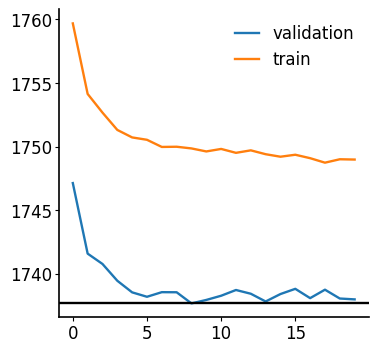

In [16]:
with mplscience.style_context():
    y = scanvi_model.history['reconstruction_loss_validation']['reconstruction_loss_validation'].min()
    plt.plot(scanvi_model.history['reconstruction_loss_validation']['reconstruction_loss_validation'], label = 'validation')
    plt.plot(scanvi_model.history['reconstruction_loss_train']['reconstruction_loss_train'], label = 'train')

    plt.axhline(y, c = 'k')
    plt.legend()
    plt.show()

In [17]:
adata = sc.read_h5ad('7_annotated_cnv_re.h5ad')
adata

AnnData object with n_obs × n_vars = 53408 × 29009
    obs: 'sample_id', 'sample_info', 'age', 'sex', 'barcode', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'pct_counts_mt', 'pct_counts_ribo', 'pct_counts_hb', 'scDblFinder_score', 'scDblFinder_class', 'doublet_score', 'predicted_doublet', 'cell_type', 'grade', 'GFP', 'leiden_res1', 'wb_anno', 'wb_conf_score', 'cellid_prediction', 'leiden_res2', 'new_cell_type', 'old_cell_type', 'leiden', 'predicted_labels', 'conf_score', 'each_cell_type'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'cell_type_colors', 'each_cell_type_colors', 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'old_cell_type_colors', 'pca', 'sample_id_colors', 'umap'
    obsm: 'X_pca', 'X_scVI', 'X_umap'
    varm: 'PCs'
    layers: 'counts', 'log1p'
    obsp: 'connectivities', 'distances'

In [18]:
del adata.obsm
del adata.obsp
del adata.uns

In [20]:
adata.X = adata.layers['counts'].copy()
np.max(adata.X)

4409.0

In [21]:
adata.raw = adata

In [22]:
adata.obsm['X_scVI'] = model_tuned.get_latent_representation()
adata.obsm["X_scANVI"] = scanvi_model.get_latent_representation()
sc.pp.neighbors(adata, use_rep = 'X_scANVI')
sc.tl.umap(adata)

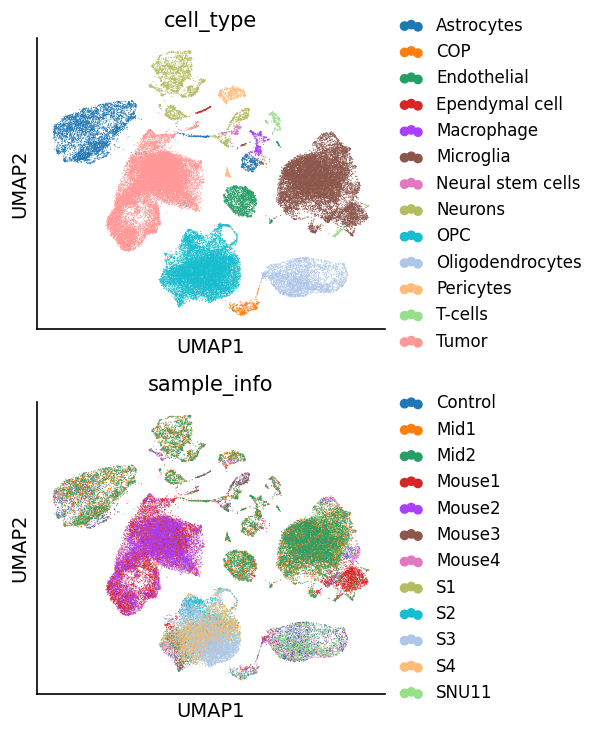

In [23]:
with mplscience.style_context():
    sc.pl.umap(adata, color = ['cell_type', 'sample_info'], ncols = 1)

In [24]:
adata.write('annotated_redo_2025.h5ad')

In [25]:
model_tuned.save('model_tuned_redo_2025')
scanvi_model.save('model_scanvi_redo_2025')

# Prune clusters

In [2]:
adata = sc.read_h5ad('../output/annotated_redo_2025.h5ad')
adata

AnnData object with n_obs × n_vars = 53408 × 29009
    obs: 'sample_id', 'sample_info', 'age', 'sex', 'barcode', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'pct_counts_mt', 'pct_counts_ribo', 'pct_counts_hb', 'scDblFinder_score', 'scDblFinder_class', 'doublet_score', 'predicted_doublet', 'cell_type', 'grade', 'GFP', 'leiden_res1', 'wb_anno', 'wb_conf_score', 'cellid_prediction', 'leiden_res2', 'new_cell_type', 'old_cell_type', 'leiden', 'predicted_labels', 'conf_score', 'each_cell_type'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'cell_type_colors', 'neighbors', 'sample_info_colors', 'umap'
    obsm: 'X_scANVI', 'X_scVI', 'X_umap'
    varm: 'PCs'
    layers: 'counts', 'log1p'
    obsp: 'connectivities', 'distances'

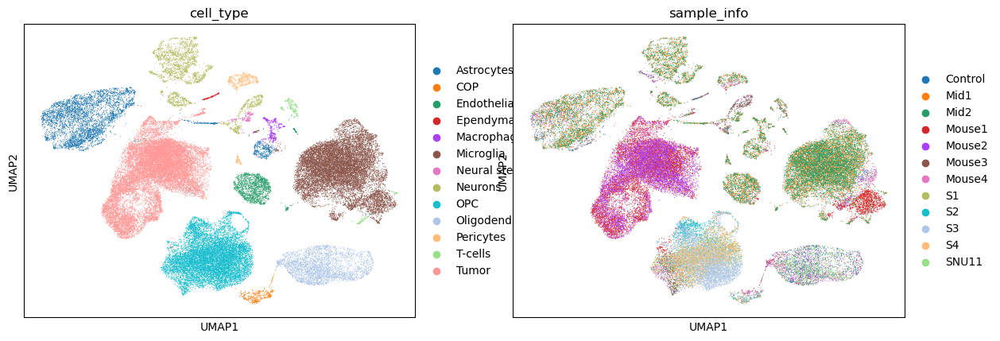

In [3]:
sc.pl.umap(adata, color = ['cell_type', 'sample_info'])

In [11]:
# sc.tl.leiden(adata, resolution = 5)
# sc.pl.umap(adata, color = ['leiden'], legend_loc = 'on data')
idx = adata.obs.leiden == '98'
# ax = sc.pl.umap(adata, palette = 'lightgrey', show = False)
# sc.pl.umap(adata[idx], color = "leiden", ax = ax, legend_loc = None, s=5, palette = 'k')
adata.obs.loc[idx, 'cell_type'] = 'Neural stem cells'

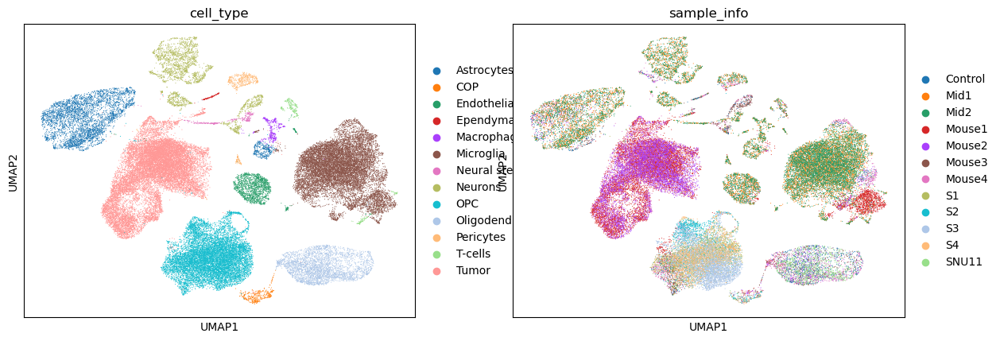

In [12]:
sc.pl.umap(adata, color = ['cell_type', 'sample_info'])

In [13]:
adata.write('../output/annotated_redo_2025.h5ad')